In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown
from scipy.stats import pearsonr, spearmanr, ks_2samp, mannwhitneyu, ttest_ind

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import resample

from utilities import threshold, data

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

## Load predictions

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 128 entries, PatientID to NoduleType
dtypes: bool(27), float64(86), int64(11), object(4)
memory usage: 12.8+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = data.prep_nlst_preds(nlst_preds_nodule, scanlevel=False, tijmen=False, sybil=False)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 128 entries, PatientID to NoduleType
dtypes: bool(27), float64(86), int64(11), object(4)
memory usage: 12.8+ MB


In [7]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    # "de Haas Combined": "Thijmen_mean_cal",
    "de Haas Local": "Thijmen_local_cal",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden_cal",
    "de Haas Global (w/nodule)": "Thijmen_global_show_cal",
    # "Sybil year 1": "sybil_year1",
    # "Sybil year 2": "sybil_year2",
    # "Sybil year 3": "sybil_year3",
    # "Sybil year 4": "sybil_year4",
    # "Sybil year 5": "sybil_year5",
    # "Sybil year 6": "sybil_year6",
    "PanCan2b": "PanCan2b",
}

## Pick threshold policies

In [8]:
policies = (
    ("Sensitivity", 0.9),
    # ("Sensitivity", 1.0),
    ("Specificity", 0.9),
    # ("Specificity", 1.0),
    # ("Youden J", 1.0),  ## Max J statistic
)

policy_threshold_df = threshold.get_threshold_policies(nlst_preds, models=MODEL_TO_COL, policies=policies, brock=True)
policy_threshold_df

,Sensitivity=0.9,Specificity=0.9,Brock
Venkadesh,0.048,0.169,0.06
de Haas Local,0.048,0.167,0.06
de Haas Global (w/nodule),0.065,0.238,0.06
PanCan2b,0.016,0.119,0.06


Save thresholds.

In [9]:
policy_threshold_df['col'] = policy_threshold_df.apply(lambda x: MODEL_TO_COL[x.name], axis=1)
policy_threshold_df.to_csv(f"{NLST_PREDS}/policy-thresholds-{len(nlst_preds)}.csv", index=True)
policy_threshold_df.drop(columns=['col'], inplace=True)

## Plot results by category

In [10]:
def plot_by_category(df, cat, metrics_to_plot=['fpr', 'fnr'], diff=True):
    display(Markdown(f"### {cat}"))
    stats = threshold.plot_threshold_stats_subgroups(
        df, cat, policy_threshold_df,
        models=MODEL_TO_COL,
        plot_metrics=metrics_to_plot,
        diff=diff, show_all=False,
        min_mal=10,
    )

### race

,num,pct,mal,ben,pct_mal
1.0,15040,93.549792,1145,13895,7.613032
2.0,481,2.991852,57,424,11.850312
3.0,228,1.418175,21,207,9.210526
4.0,68,0.422964,12,56,17.647059
5.0,44,0.273683,2,42,4.545455
6.0,177,1.100952,10,167,5.649718


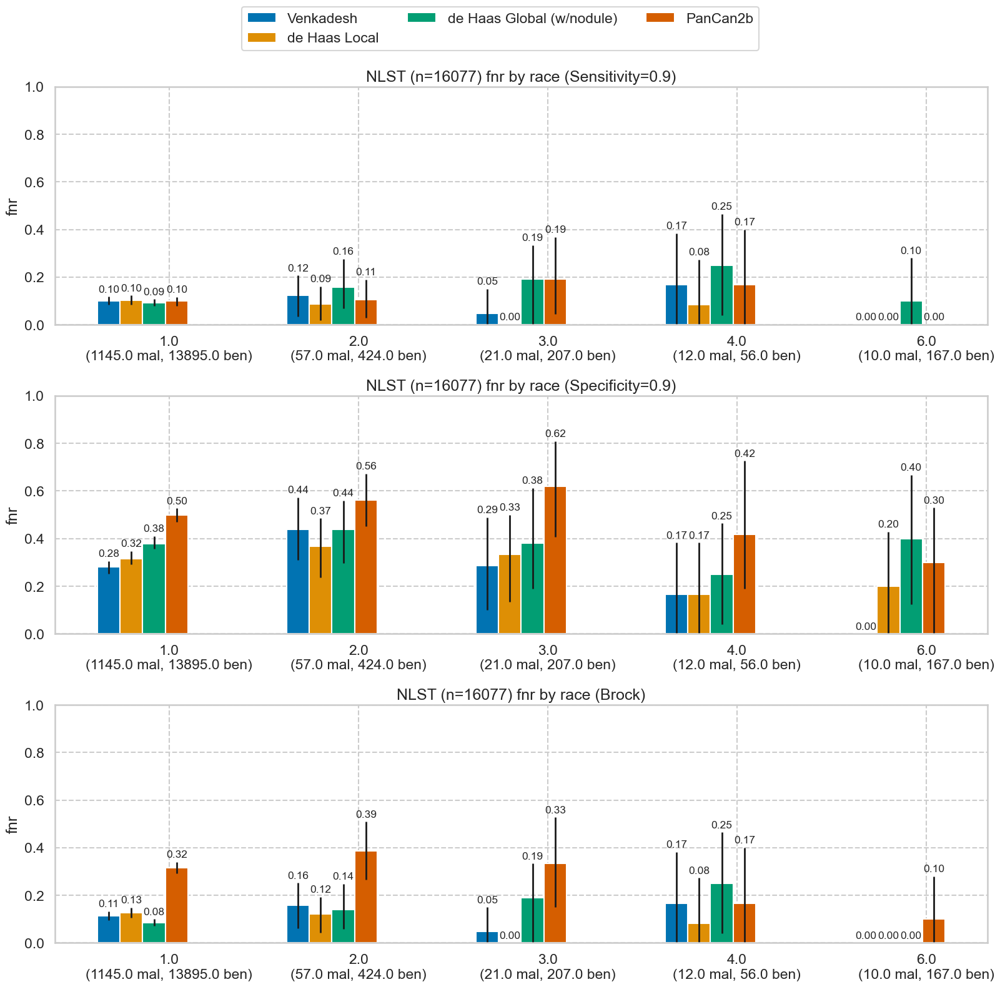

In [11]:
plot_by_category(nlst_preds, 'race', metrics_to_plot=['fnr'], diff=False)

### Included columns (from predictions)

### FamilyHistoryLungCa

,num,pct,mal,ben,pct_mal
False,11979,74.51017,870,11109,7.262710
True,4098,25.48983,379,3719,9.248414


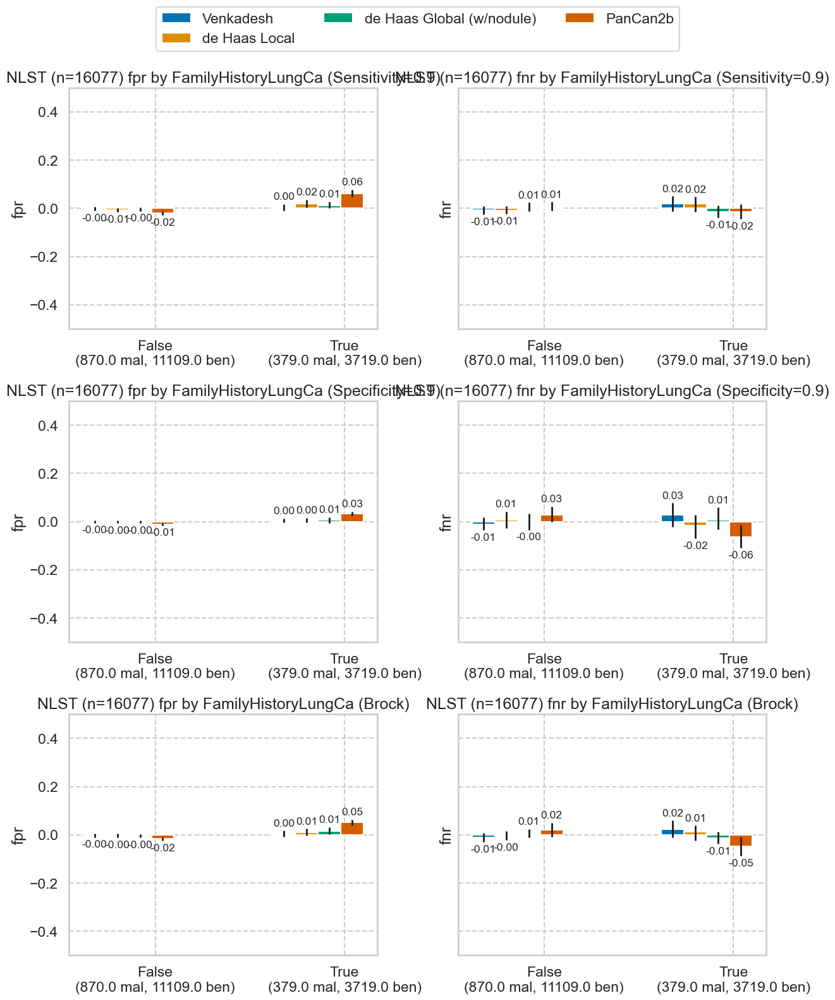

### PersonalCancerHist

,num,pct,mal,ben,pct_mal
False,15361,95.546433,1174,14187,7.642732
True,716,4.453567,75,641,10.474860


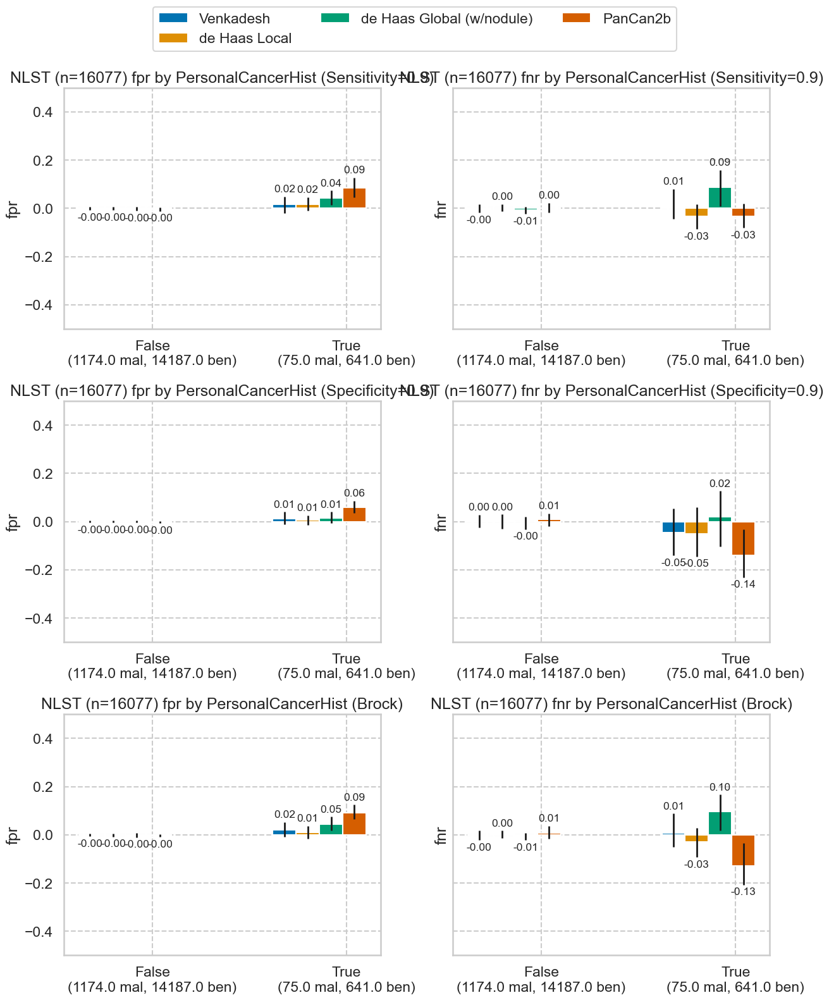

### wrknomask

,num,pct,mal,ben,pct_mal
False,12041,74.895814,943,11098,7.831575
True,4036,25.104186,306,3730,7.581764


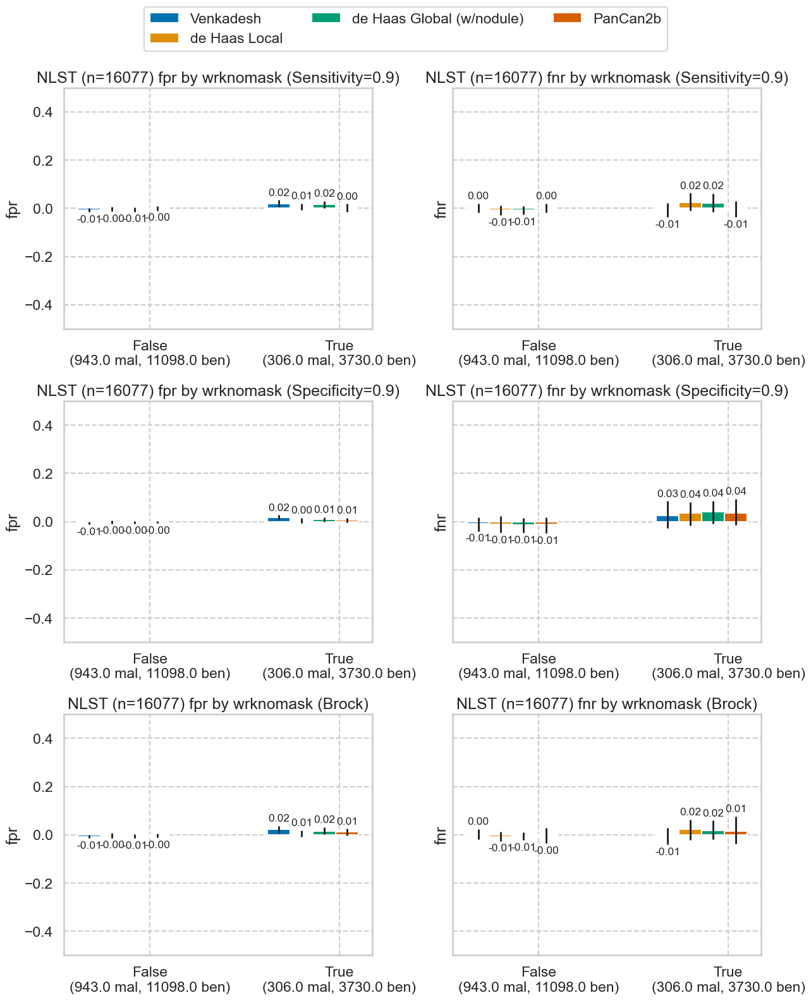

### Emphysema

,num,pct,mal,ben,pct_mal
False,10385,64.595385,697,9688,6.711603
True,5692,35.404615,552,5140,9.697822


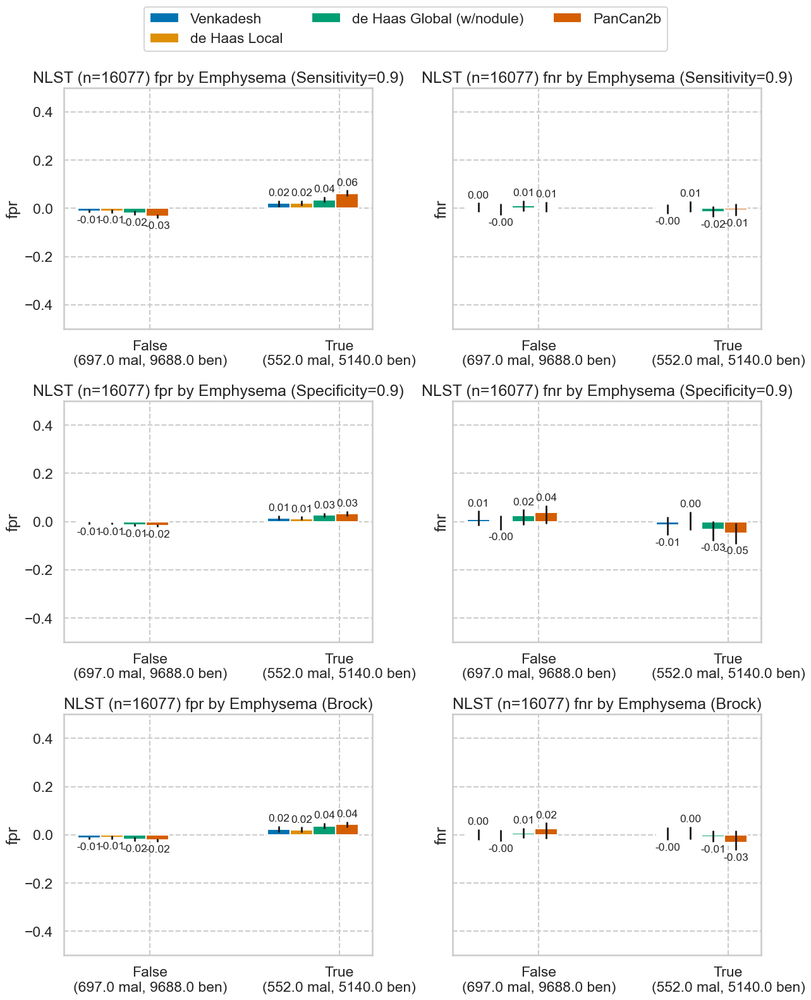

In [12]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Nodule information

### GroundGlassOpacity

,num,pct,mal,ben,pct_mal
False,12466,77.539342,1249,11217,10.019252
True,3611,22.460658,0,3611,0.000000


### NoduleInUpperLung

,num,pct,mal,ben,pct_mal
False,9331,58.039435,483,8848,5.176294
True,6746,41.960565,766,5980,11.354877


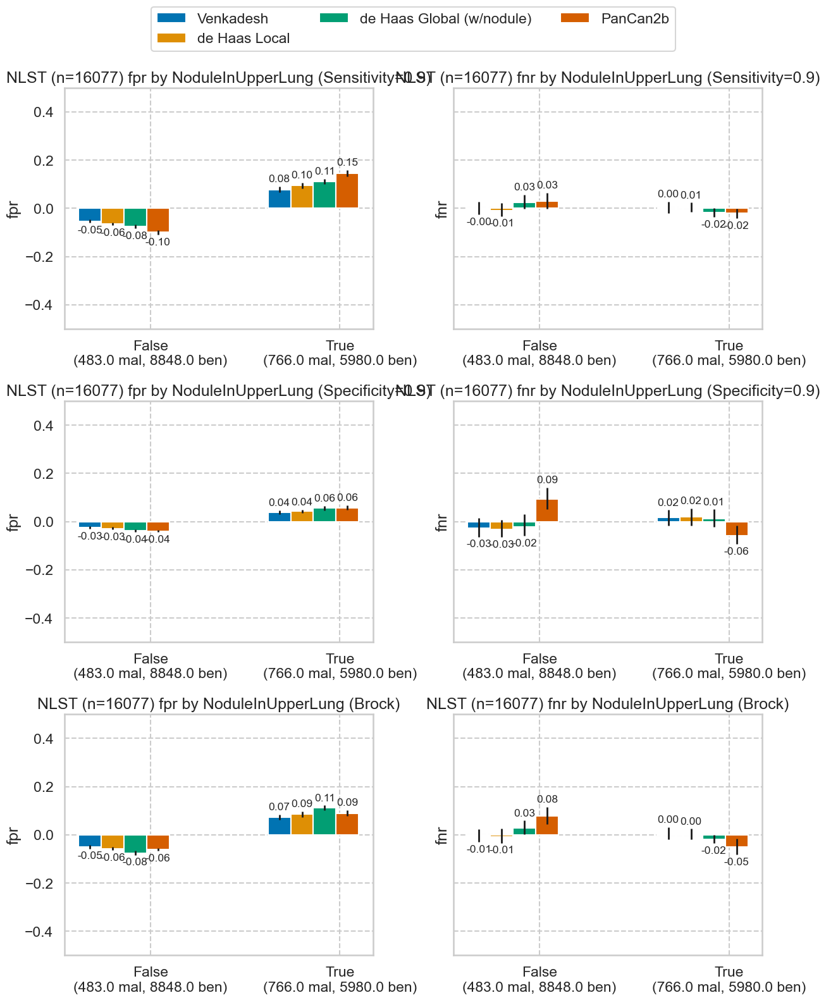

### Perifissural

,num,pct,mal,ben,pct_mal
False,15148,94.221559,1249,13899,8.245313
True,929,5.778441,0,929,0.000000


### NonSolid

,num,pct,mal,ben,pct_mal
False,15951,99.216272,1123,14828,7.040311
True,126,0.783728,126,0,100.000000


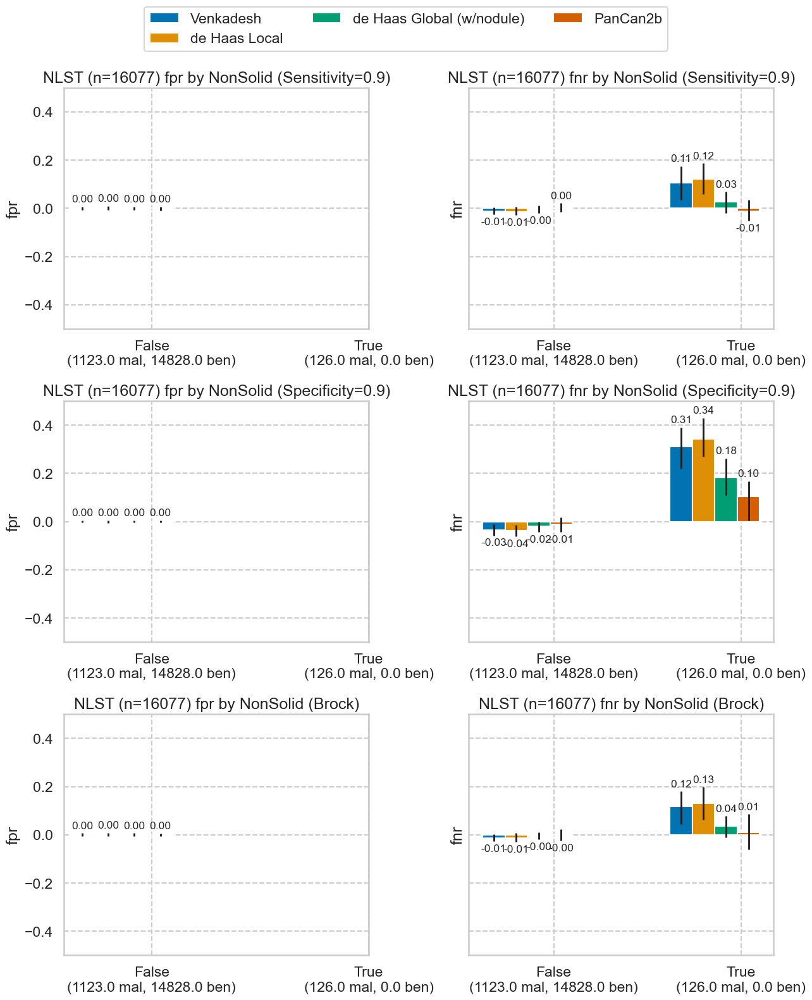

### Calcified

,num,pct,mal,ben,pct_mal
False,16069,99.950239,1249,14820,7.77273
True,8,0.049761,0,8,0.00000


### Spiculation

,num,pct,mal,ben,pct_mal
False,16057,99.875599,1230,14827,7.660211
True,20,0.124401,19,1,95.000000


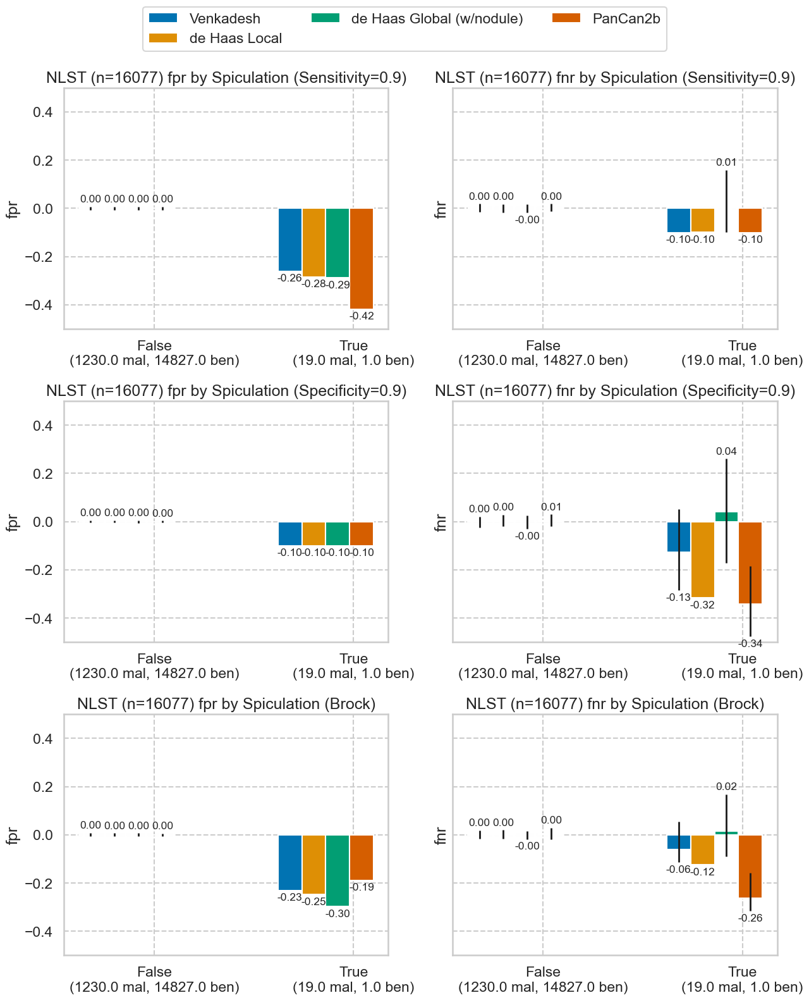

### PartSolid

,num,pct,mal,ben,pct_mal
False,15832,98.476084,1004,14828,6.341587
True,245,1.523916,245,0,100.000000


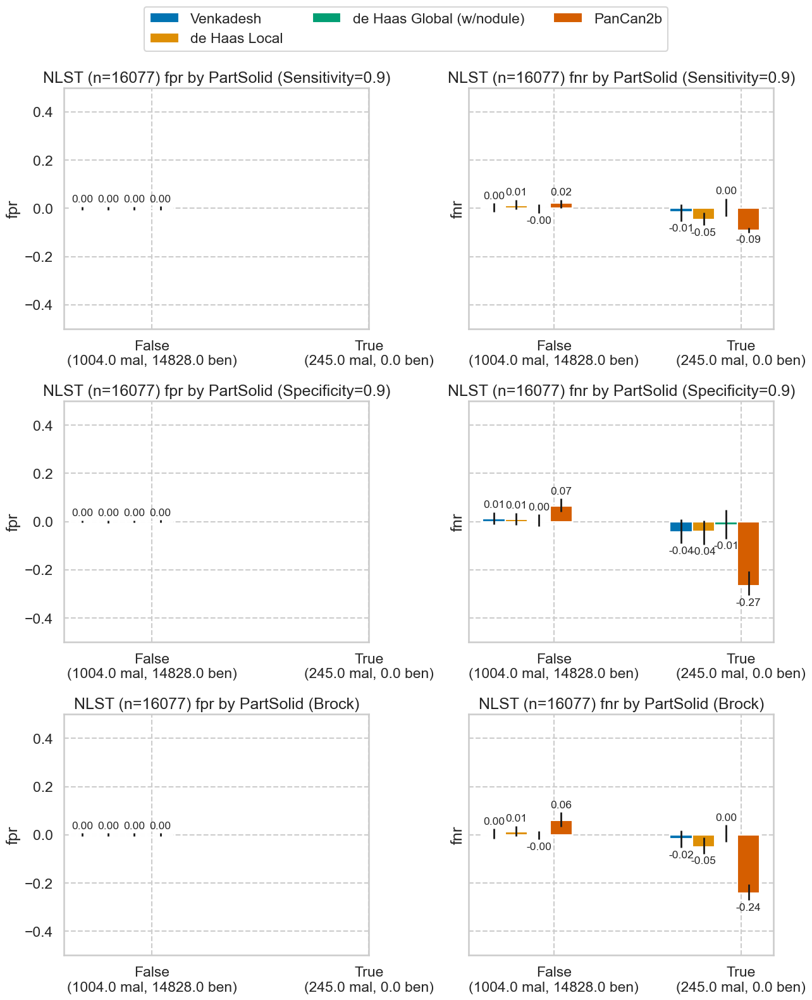

### Solid

,num,pct,mal,ben,pct_mal
False,6391,39.752441,371,6020,5.805038
True,9686,60.247559,878,8808,9.064629


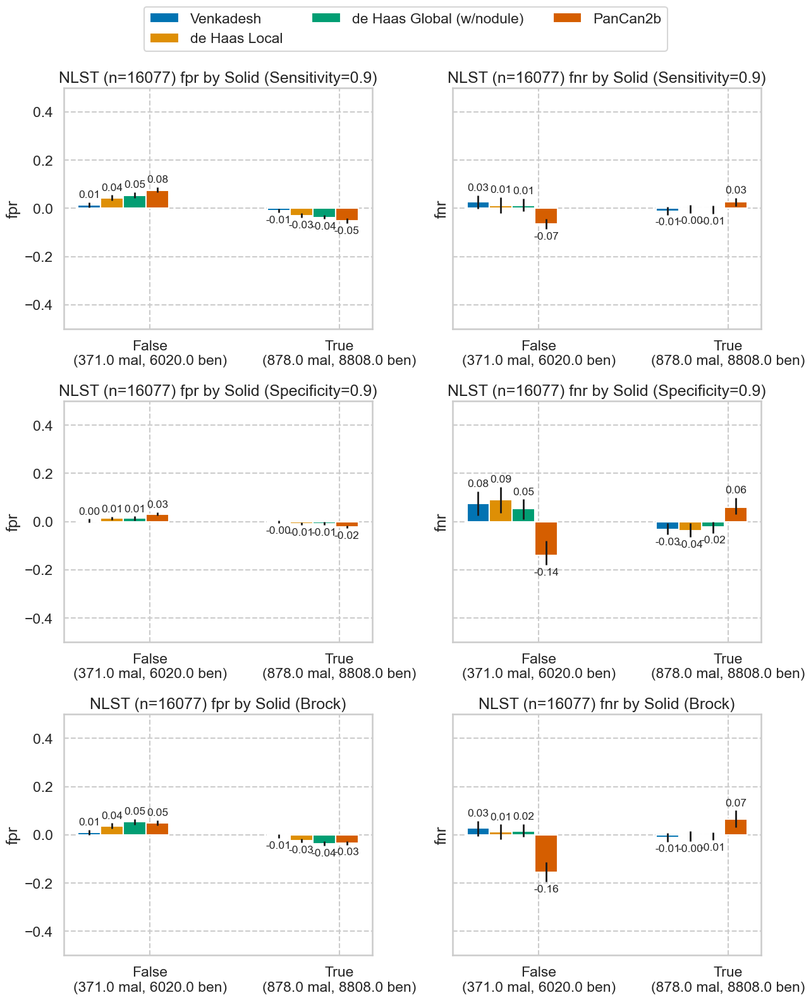

### SemiSolid

,num,pct,mal,ben,pct_mal
False,14605,90.844063,1249,13356,8.551866
True,1472,9.155937,0,1472,0.000000


In [13]:
for cat in nlst_democols['cat']['nodule']:
    plot_by_category(nlst_preds, cat)

### Demographics

### Overweight

,num,pct,mal,ben,pct_mal
False,5062,31.485974,445,4617,8.790992
True,11015,68.514026,804,10211,7.299138


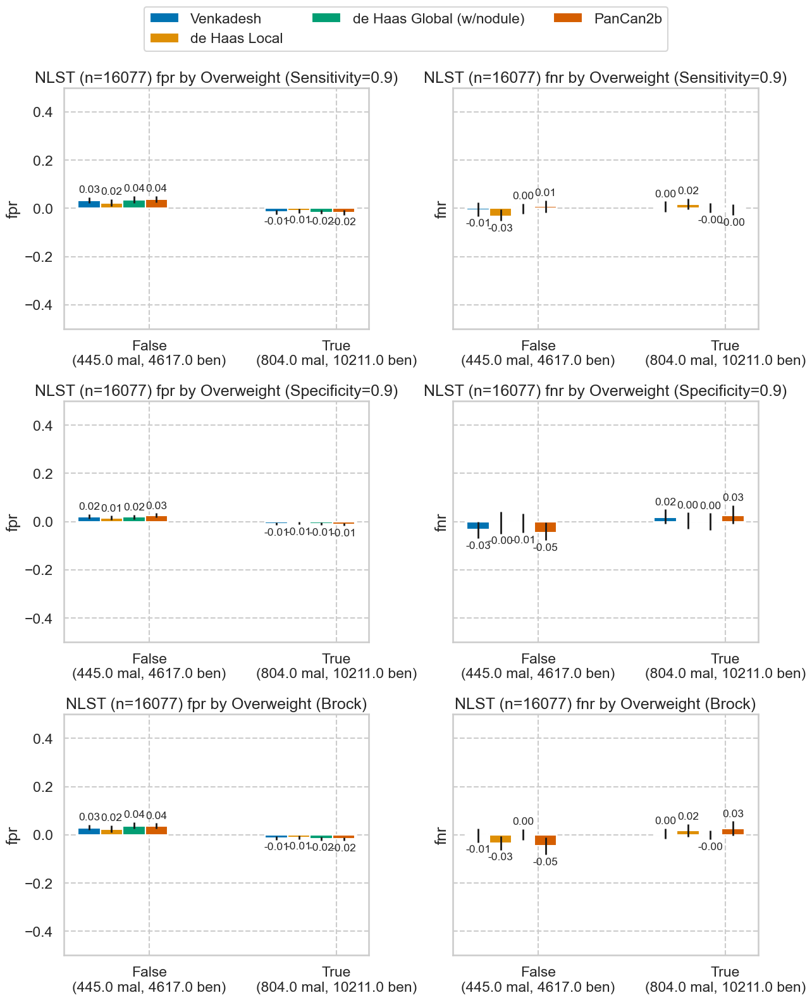

### educat

,num,pct,mal,ben,pct_mal
1.0,268,1.666978,24,244,8.955224
2.0,872,5.423897,74,798,8.486239
3.0,4077,25.359209,311,3766,7.628158
4.0,2307,14.349692,176,2131,7.628955
5.0,3539,22.012813,304,3235,8.589997
6.0,2493,15.506624,187,2306,7.501003
7.0,2239,13.926728,145,2094,6.476105


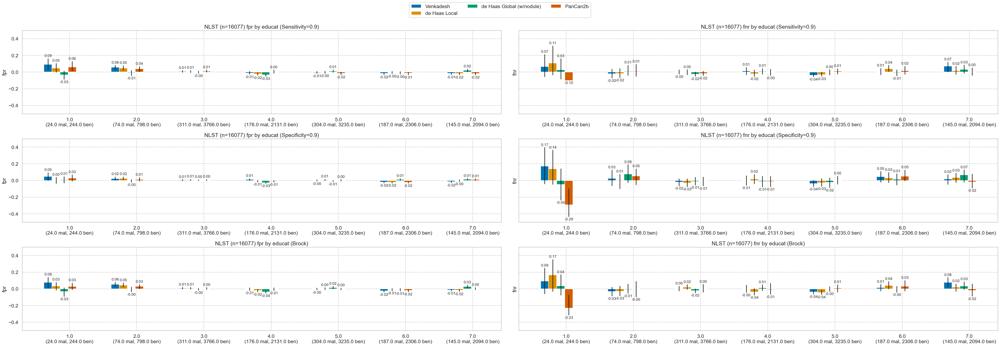

### Gender

,num,pct,mal,ben,pct_mal
1,9281,57.728432,727,8554,7.833208
2,6796,42.271568,522,6274,7.680989


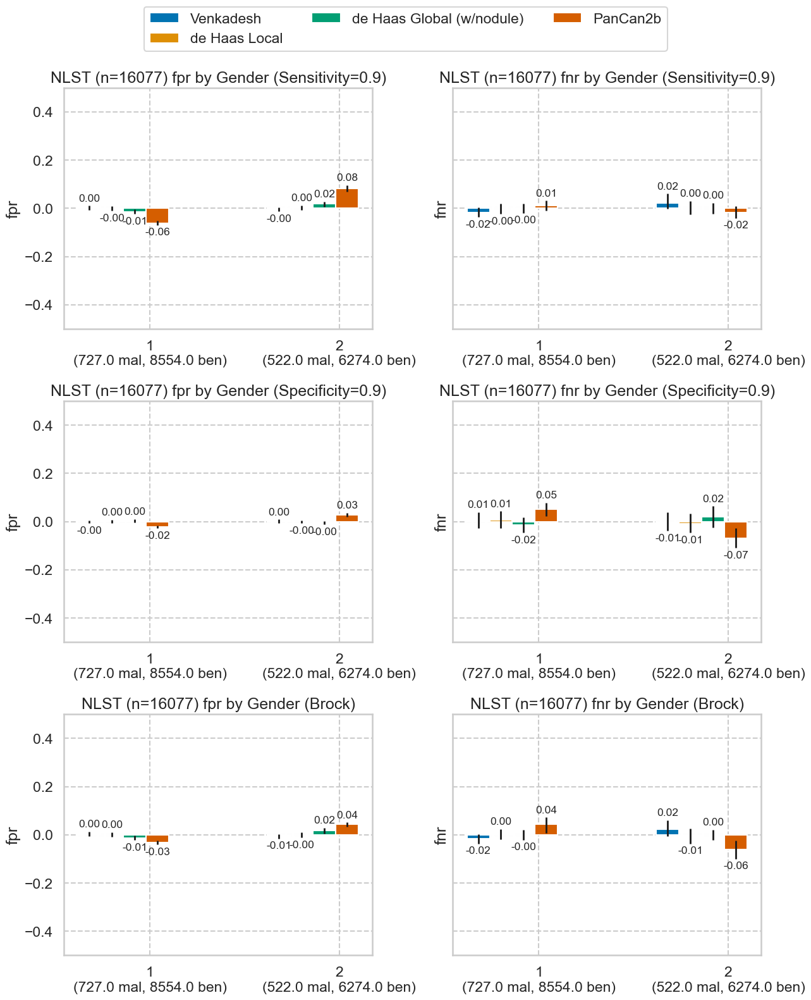

### Married

,num,pct,mal,ben,pct_mal
False,5179,32.213721,453,4726,8.746862
True,10898,67.786279,796,10102,7.304092


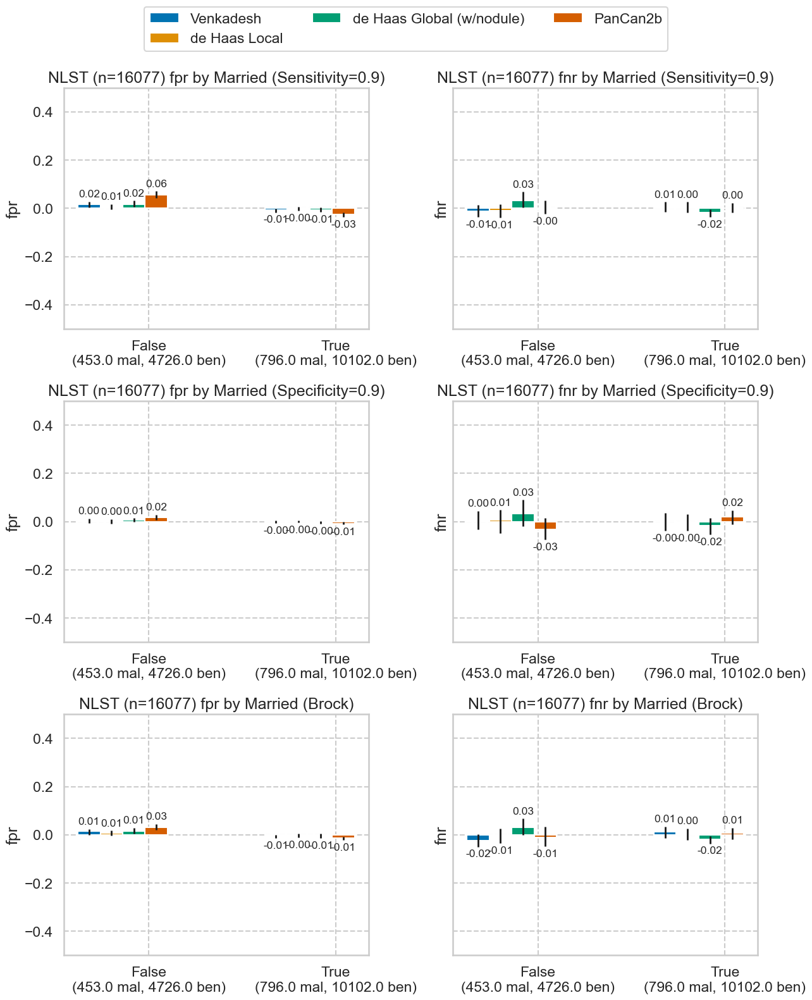

### HighSchoolPlus

,num,pct,mal,ben,pct_mal
False,268,1.666978,24,244,8.955224
True,15809,98.333022,1225,14584,7.748751


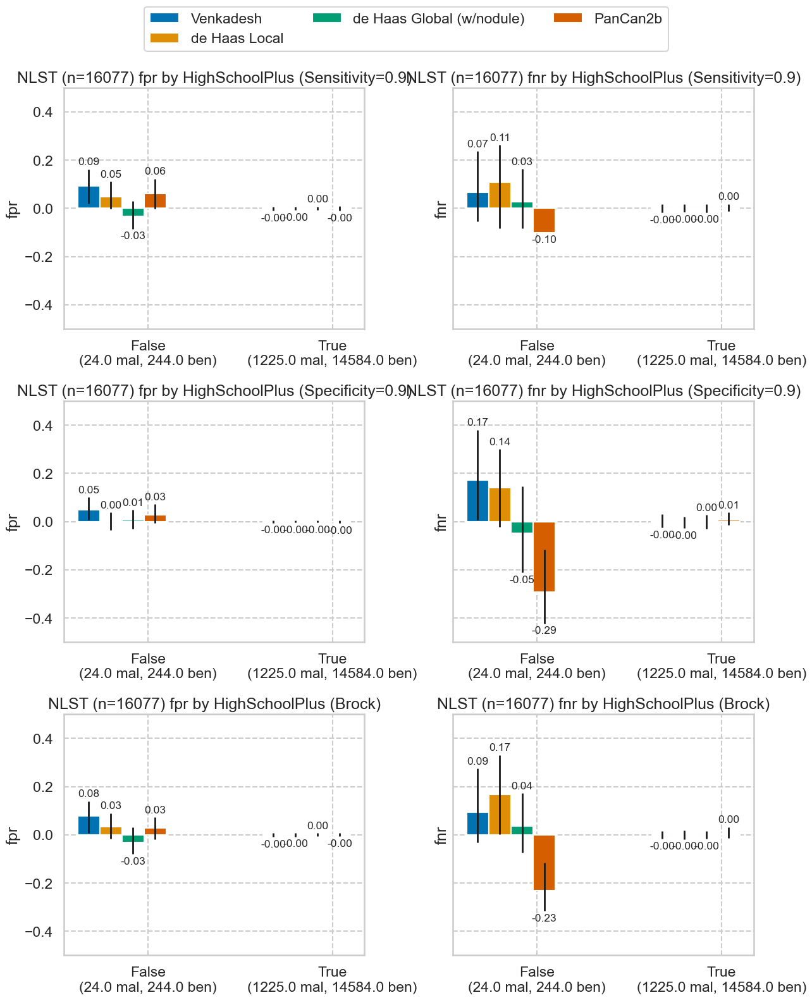

### NonHispanicWhite

,num,pct,mal,ben,pct_mal
False,1259,7.831063,118,1141,9.372518
True,14818,92.168937,1131,13687,7.632609


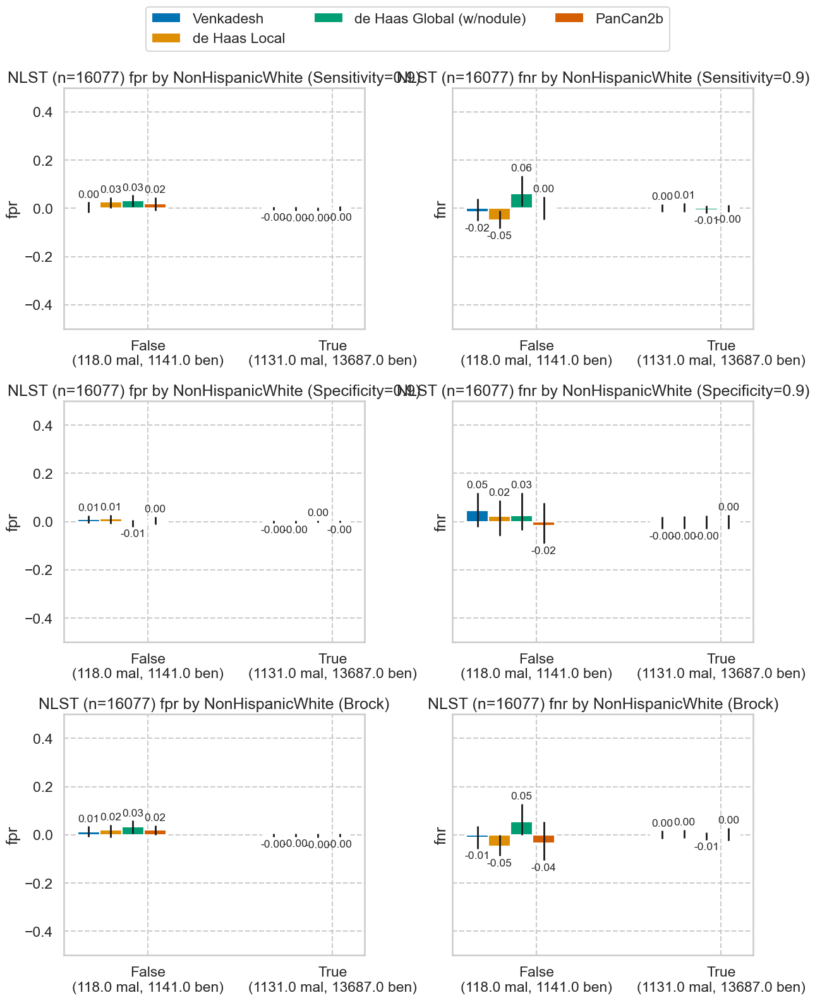

### Unfinished_ed

,num,pct,mal,ben,pct_mal
False,11666,72.563289,871,10795,7.466141
True,4411,27.436711,378,4033,8.569485


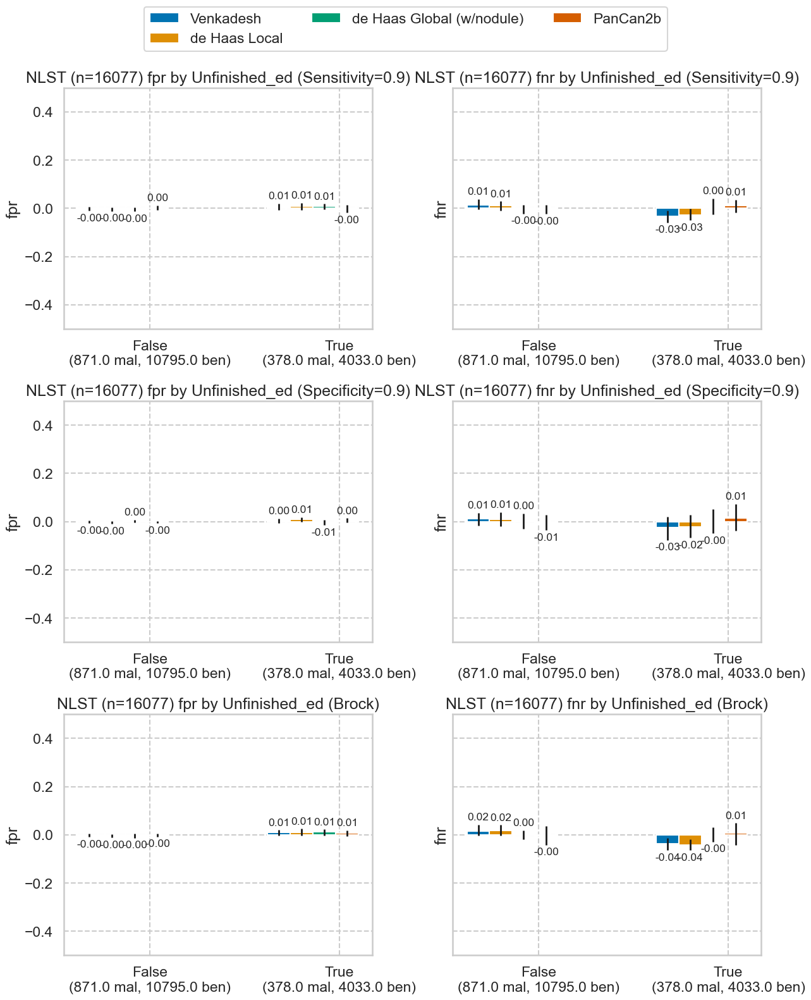

### WhiteOrBlack

,num,pct,mal,ben,pct_mal
1.0,15040,93.549792,1145,13895,7.613032
2.0,481,2.991852,57,424,11.850312


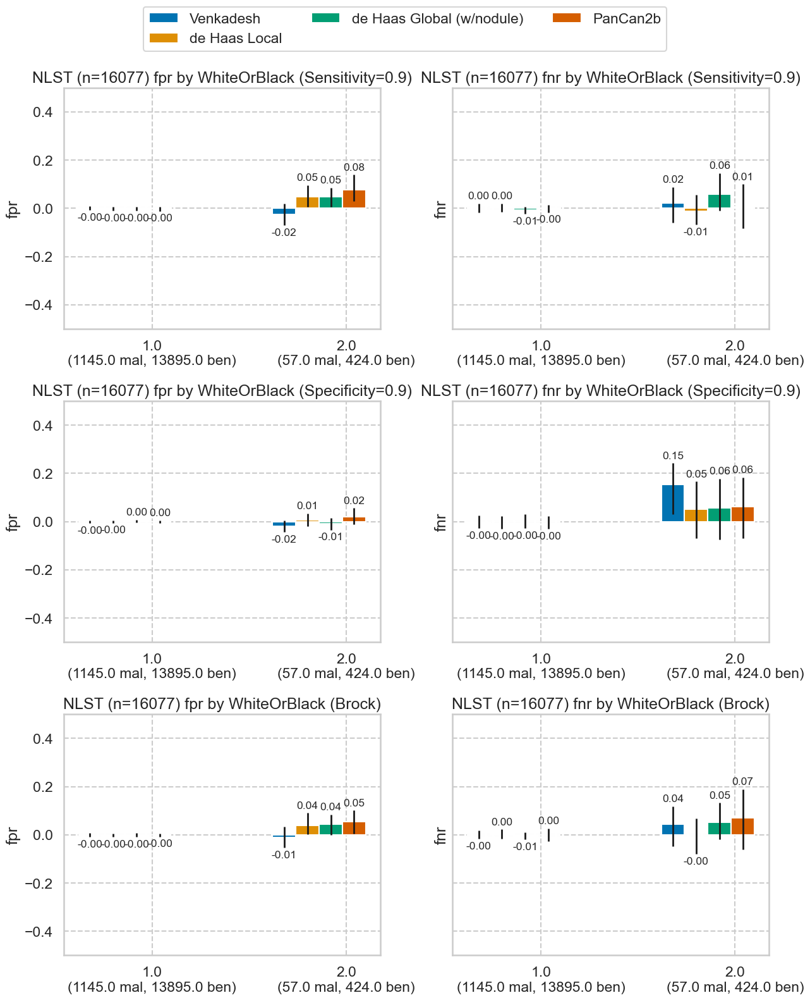

### marital

,num,pct,mal,ben,pct_mal
1.0,644,4.005722,48,596,7.453416
2.0,10898,67.786279,796,10102,7.304092
3.0,1327,8.254027,127,1200,9.570460
4.0,206,1.281334,17,189,8.252427
5.0,2957,18.392735,259,2698,8.758877


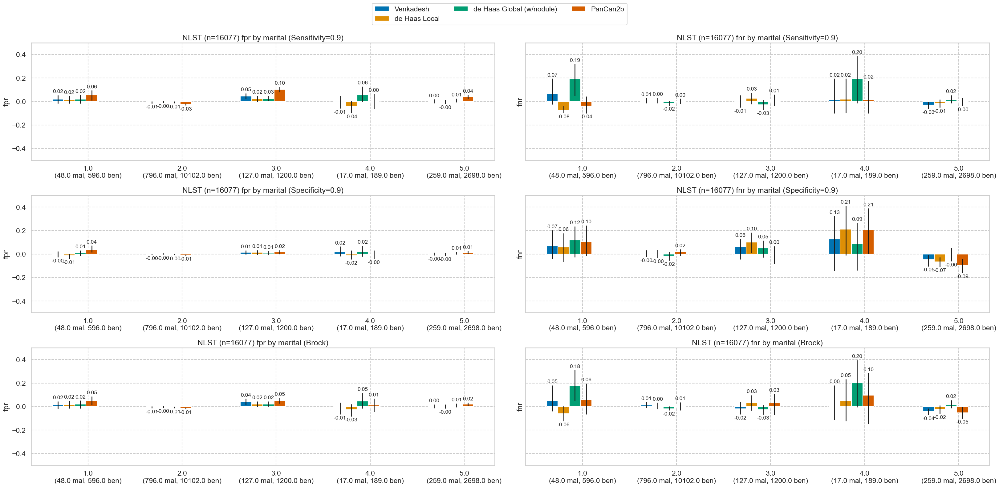

### ethnic

,num,pct,mal,ben,pct_mal
1.0,210,1.306214,9,201,4.285714
2.0,15779,98.146420,1230,14549,7.795171


### race

,num,pct,mal,ben,pct_mal
1.0,15040,93.549792,1145,13895,7.613032
2.0,481,2.991852,57,424,11.850312
3.0,228,1.418175,21,207,9.210526
4.0,68,0.422964,12,56,17.647059
5.0,44,0.273683,2,42,4.545455
6.0,177,1.100952,10,167,5.649718


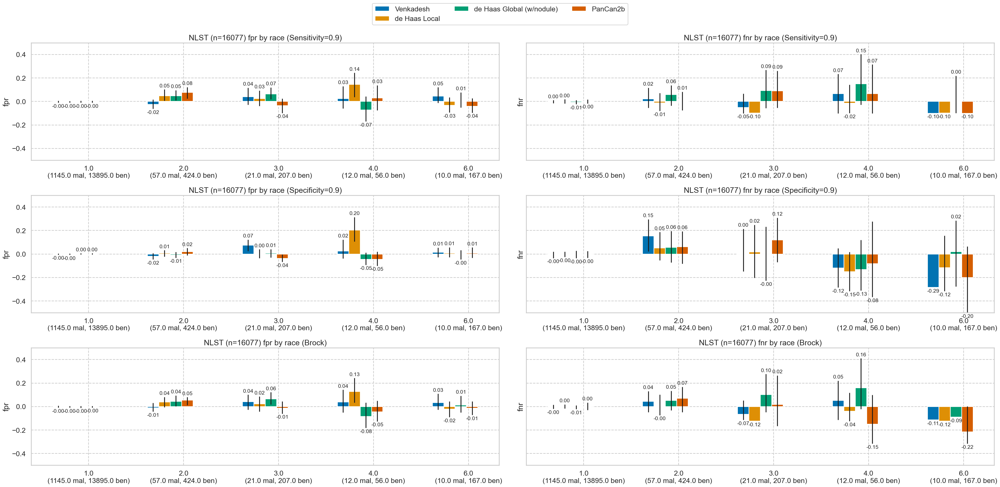

In [14]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

### smokelive

,num,pct,mal,ben,pct_mal
0.0,1870,11.631523,133,1737,7.112299
1.0,14142,87.964172,1110,13032,7.848961


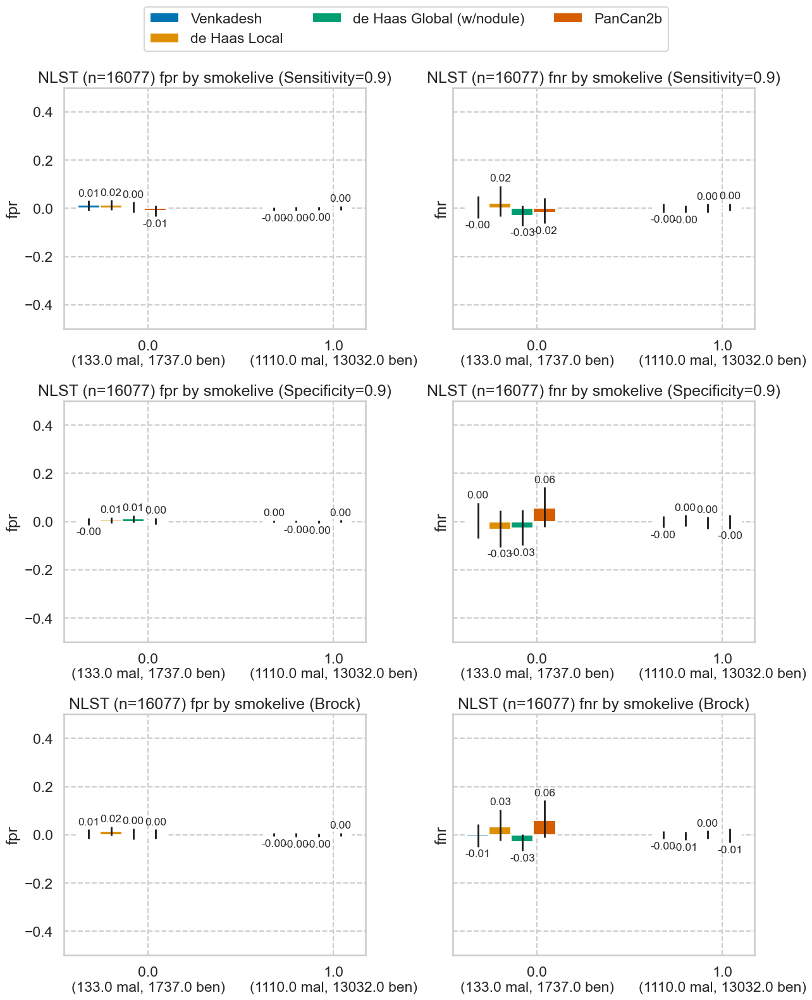

### cigar

,num,pct,mal,ben,pct_mal
0.0,13031,81.053679,1005,12026,7.712378
1.0,2996,18.635318,240,2756,8.010681


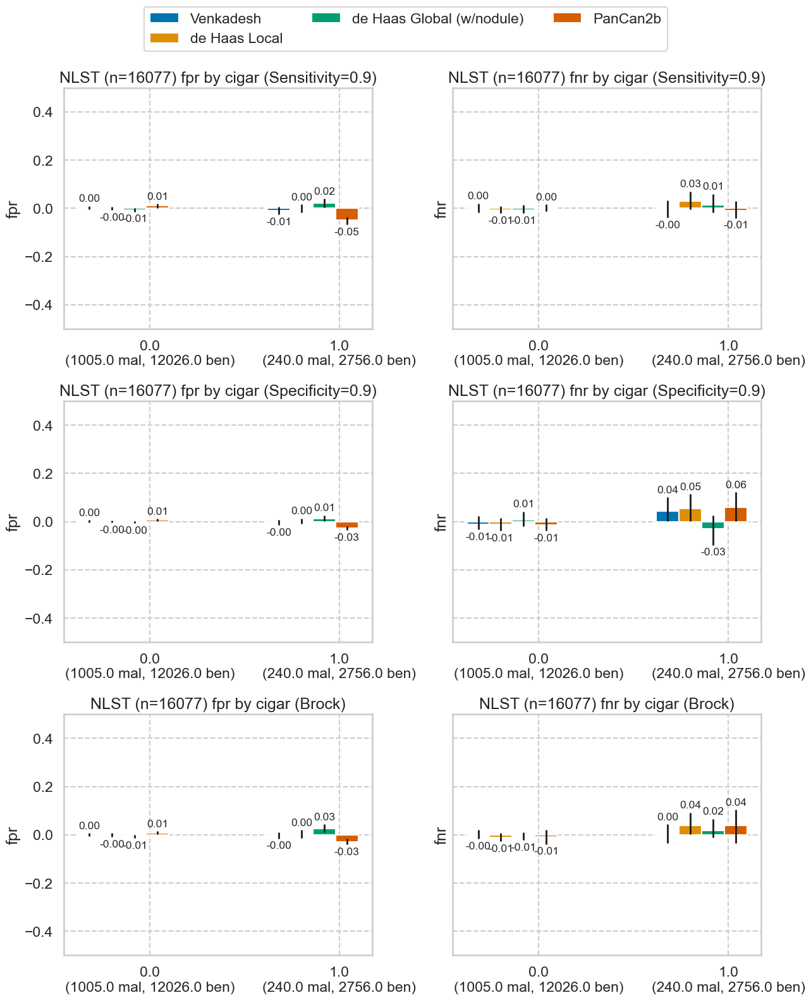

### cigsmok

,num,pct,mal,ben,pct_mal
0,7911,49.206942,575,7336,7.268361
1,8166,50.793058,674,7492,8.253735


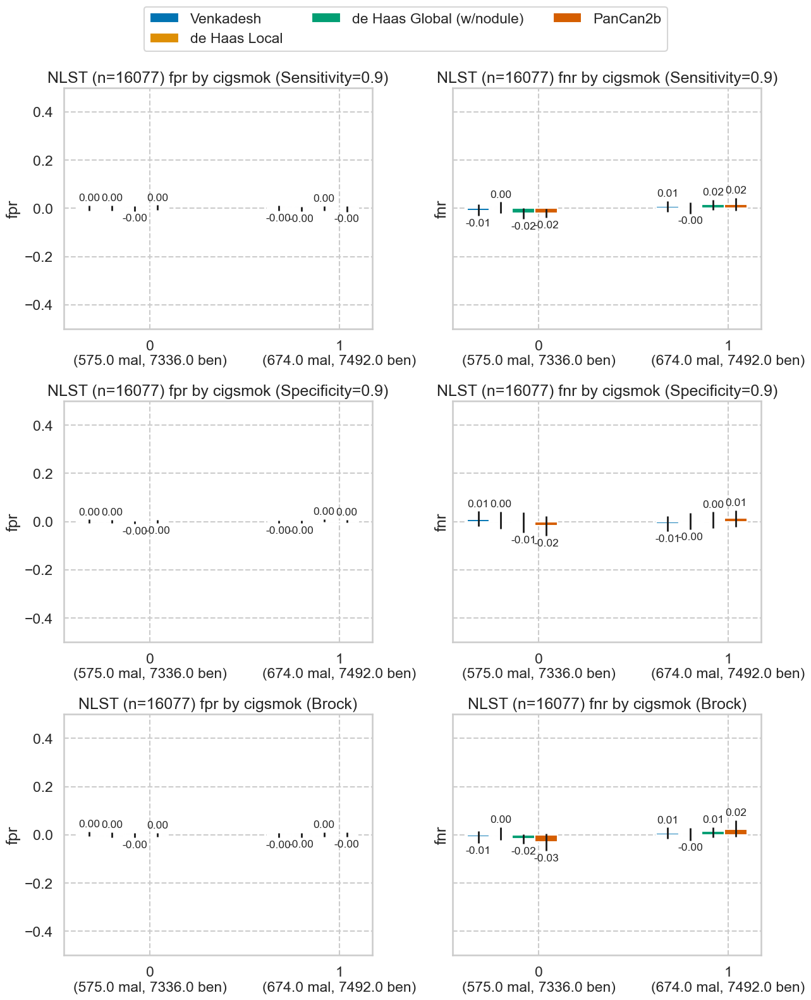

### smokework

,num,pct,mal,ben,pct_mal
0.0,2041,12.695155,142,1899,6.957374
1.0,13924,86.608198,1095,12829,7.864120


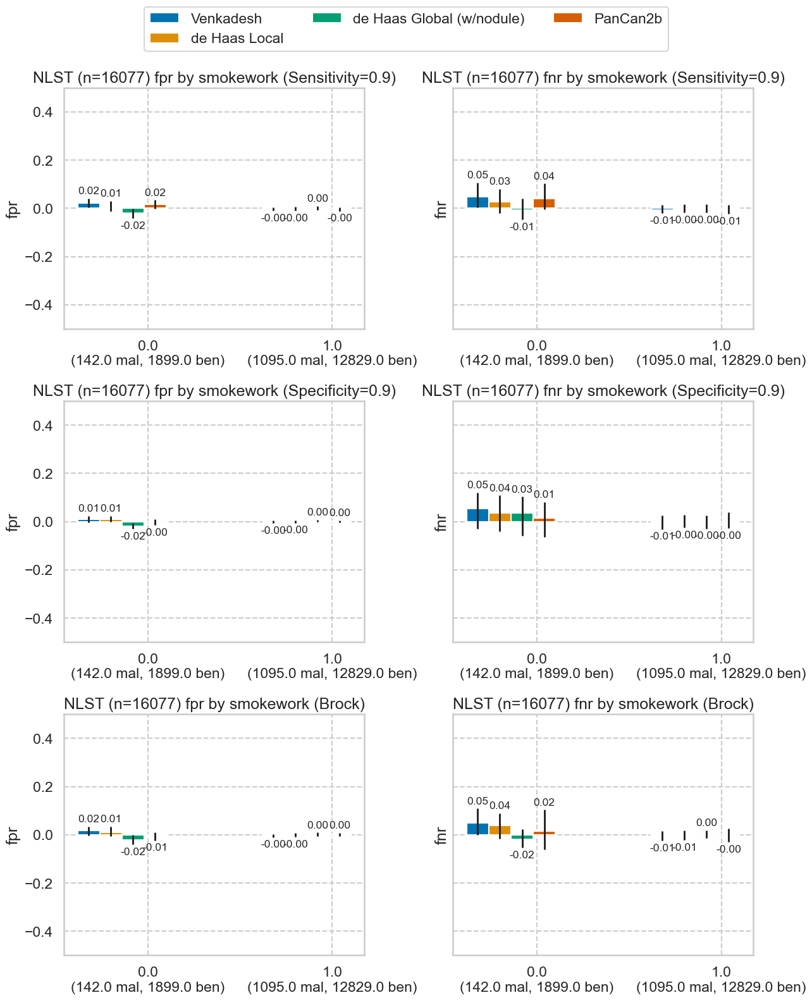

### pipe

,num,pct,mal,ben,pct_mal
0.0,12542,78.012067,948,11594,7.558603
1.0,3438,21.384587,297,3141,8.638743


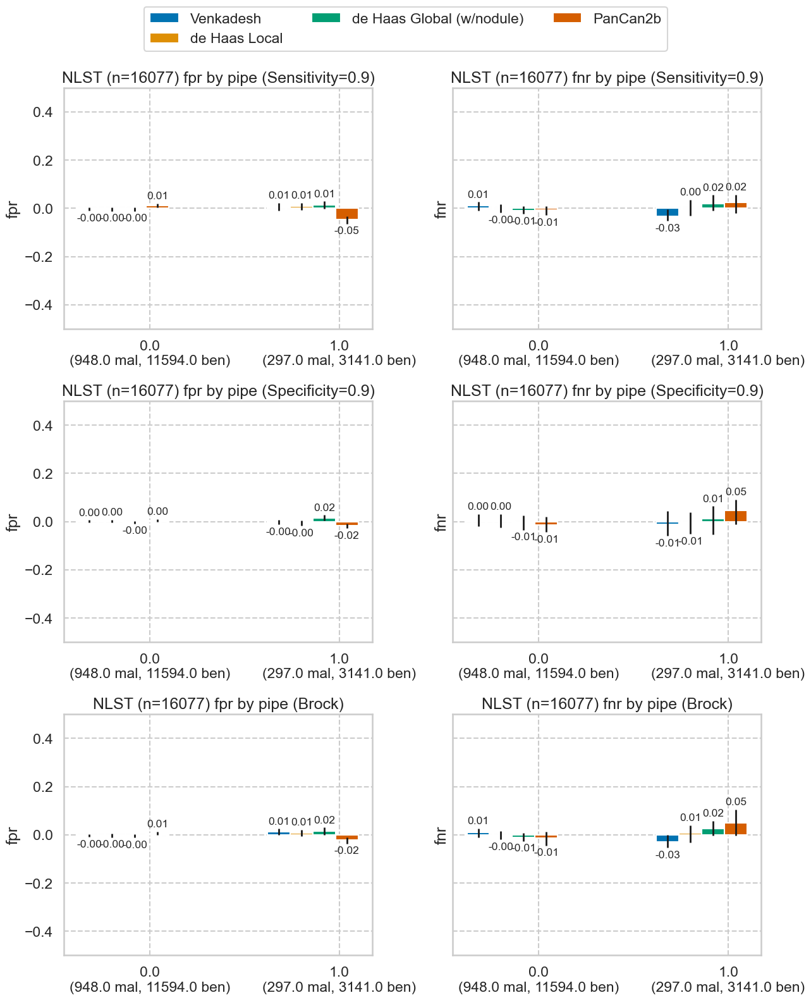

In [15]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

### wrkbaki

,num,pct,mal,ben,pct_mal
0.0,15644,97.306711,1221,14423,7.804909
1.0,432,2.687068,27,405,6.250000


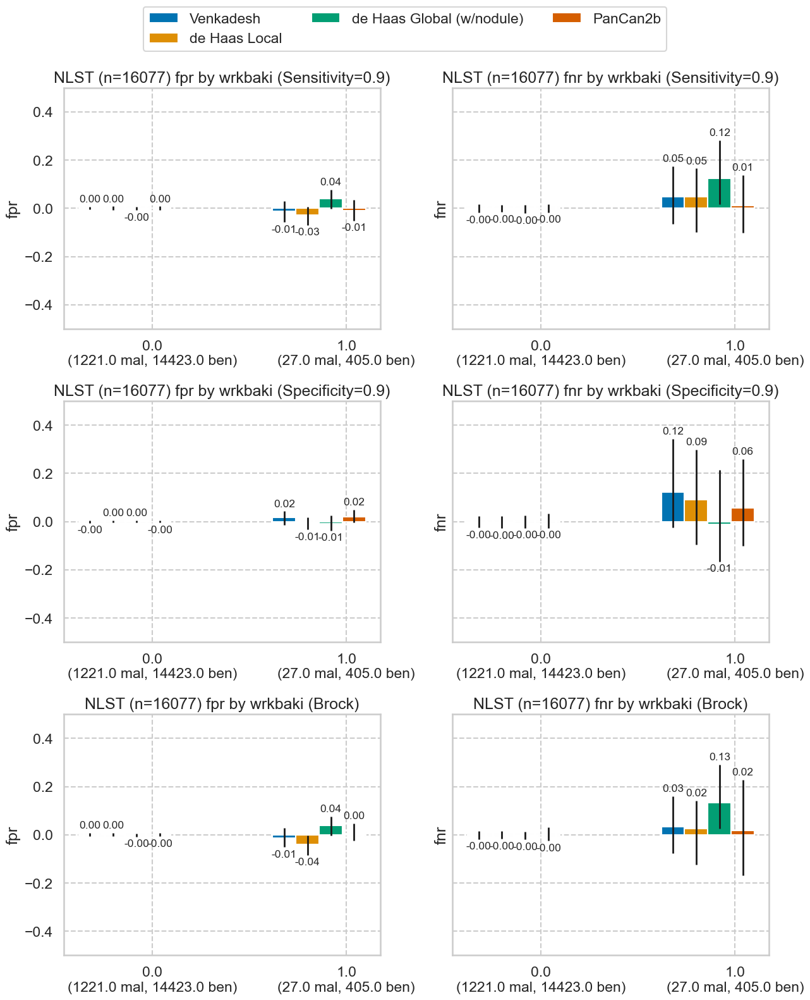

### wrkfoun

,num,pct,mal,ben,pct_mal
0.0,15409,95.844996,1182,14227,7.670842
1.0,667,4.148784,66,601,9.895052


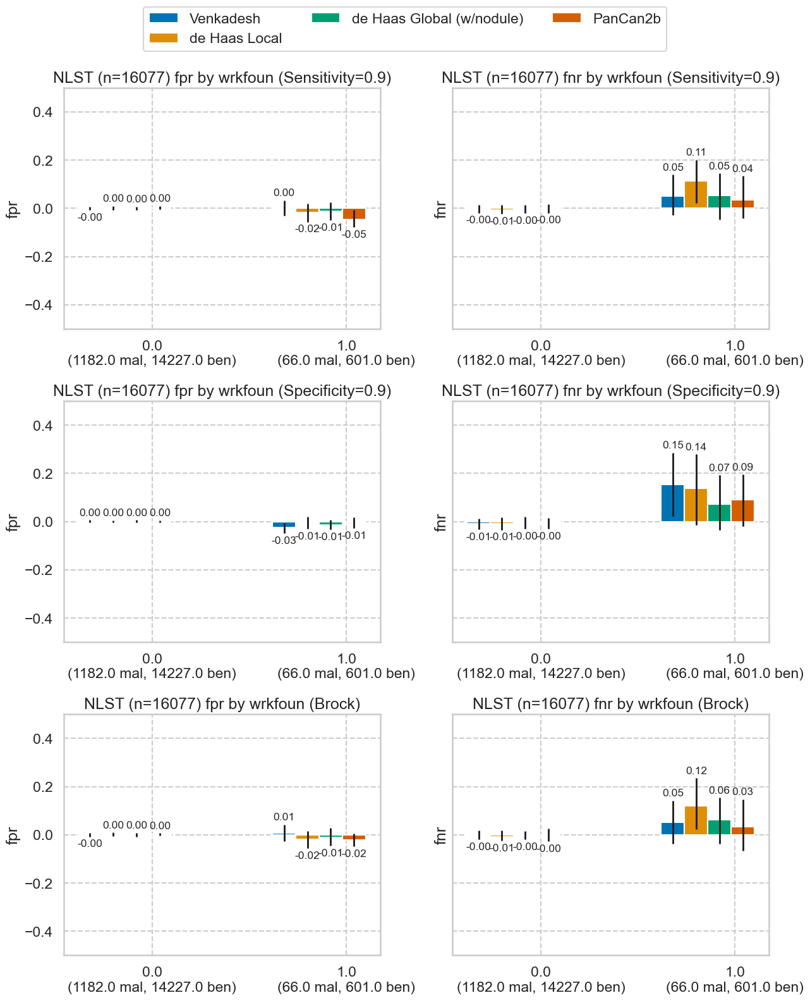

### wrkchem

,num,pct,mal,ben,pct_mal
0.0,15000,93.300989,1171,13829,7.806667
1.0,1063,6.611930,77,986,7.243650


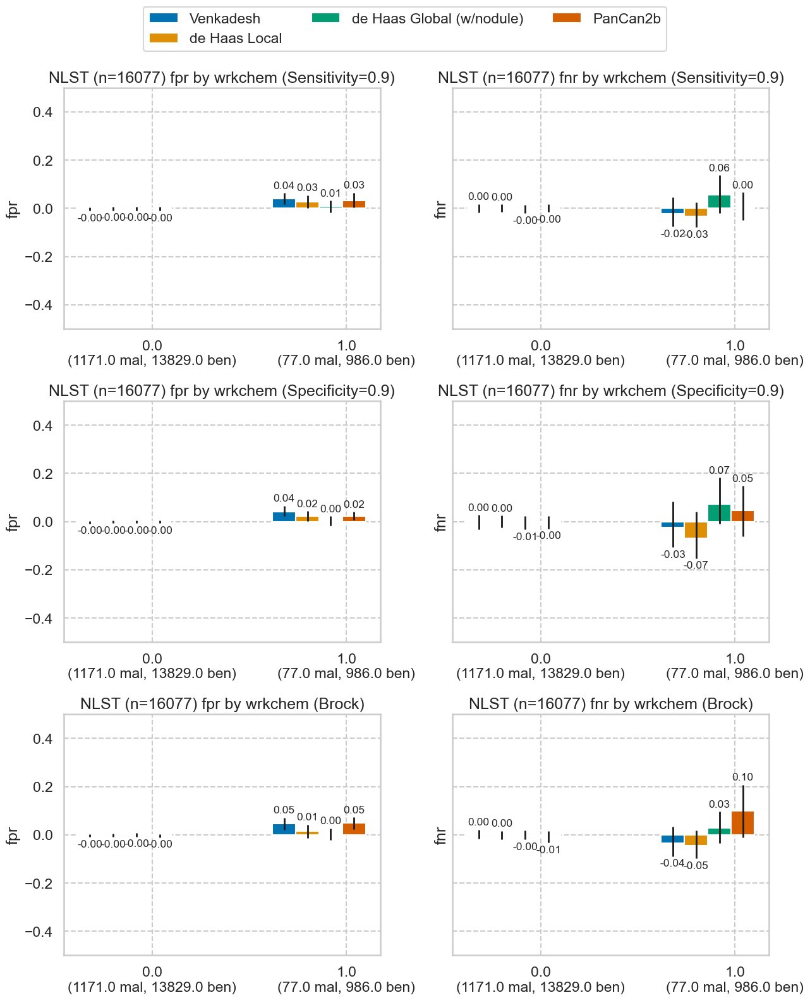

### wrkasbe

,num,pct,mal,ben,pct_mal
0.0,15277,95.023947,1182,14095,7.737121
1.0,789,4.907632,66,723,8.365019


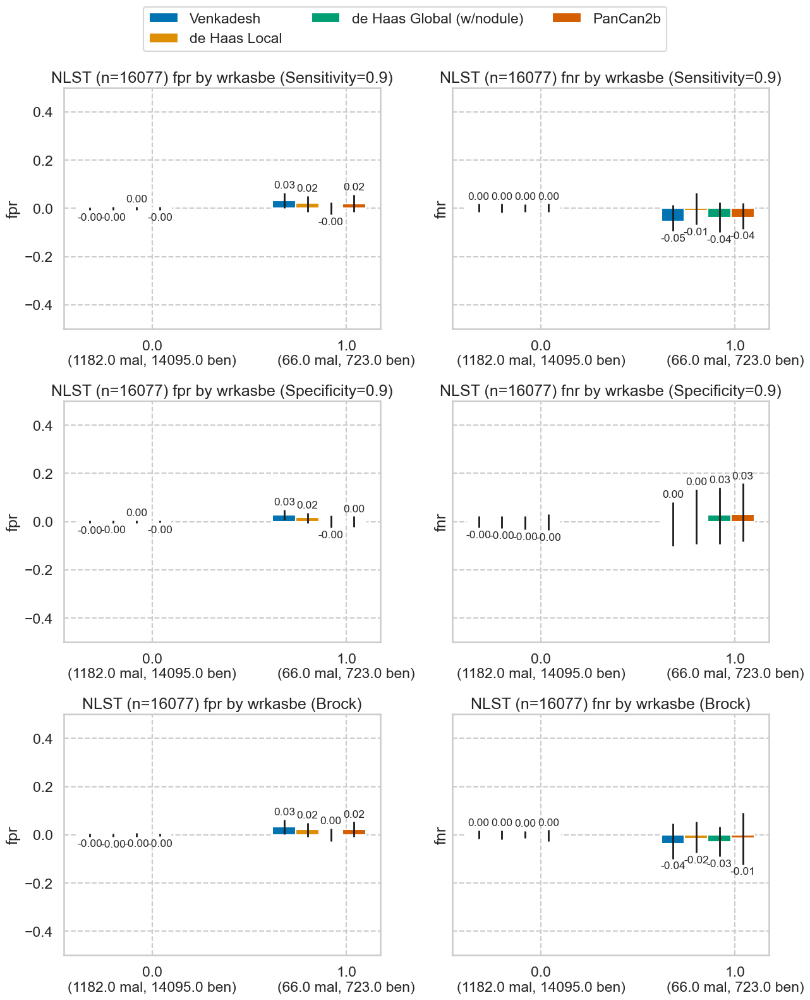

### wrkfire

,num,pct,mal,ben,pct_mal
0.0,15808,98.326802,1219,14589,7.711285
1.0,268,1.666978,29,239,10.820896


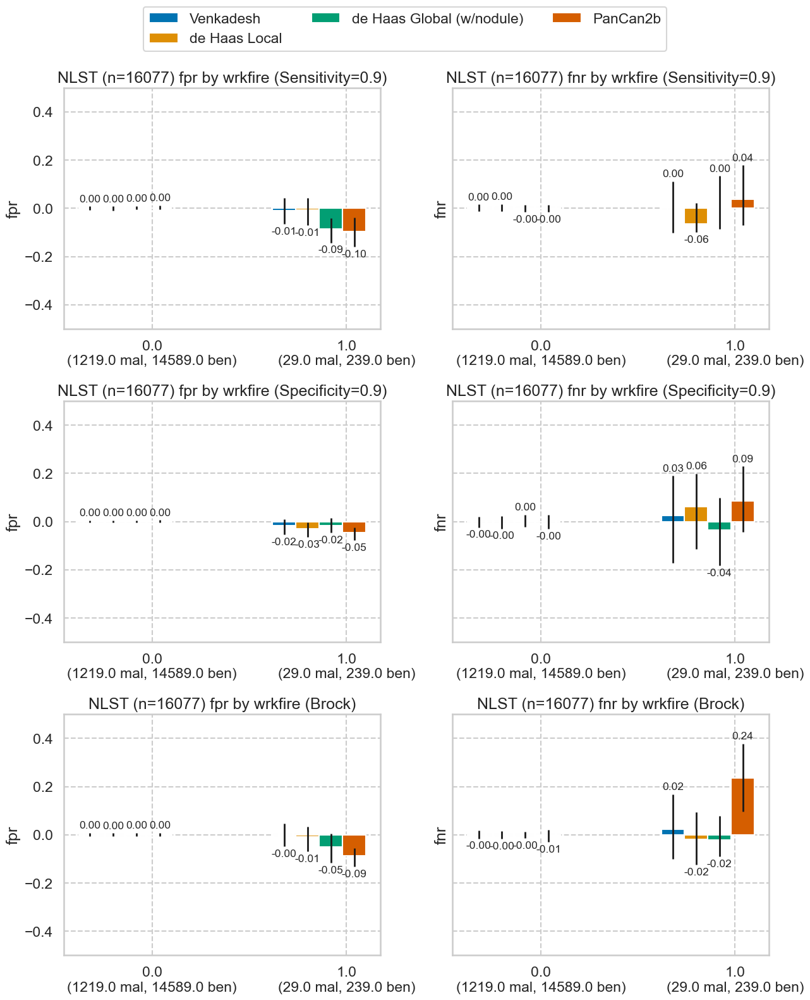

### wrksand

,num,pct,mal,ben,pct_mal
0.0,15834,98.488524,1213,14621,7.66073
1.0,242,1.505256,35,207,14.46281


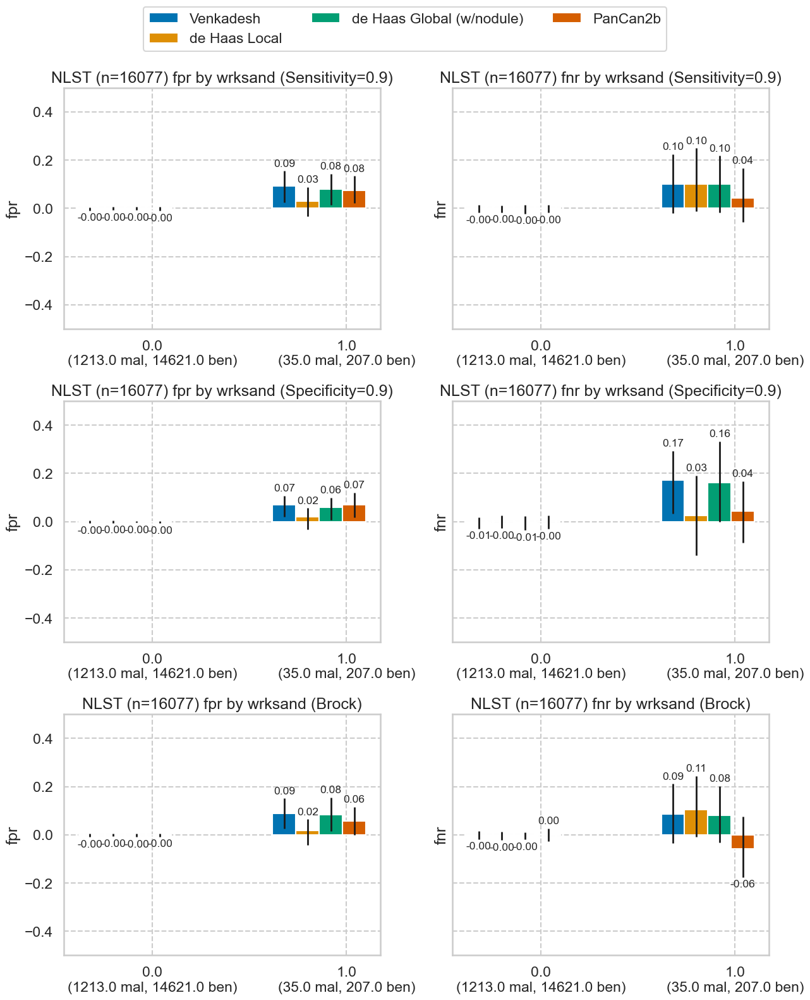

### wrkfarm

,num,pct,mal,ben,pct_mal
0.0,14253,88.65460,1124,13129,7.886059
1.0,1820,11.32052,121,1699,6.648352


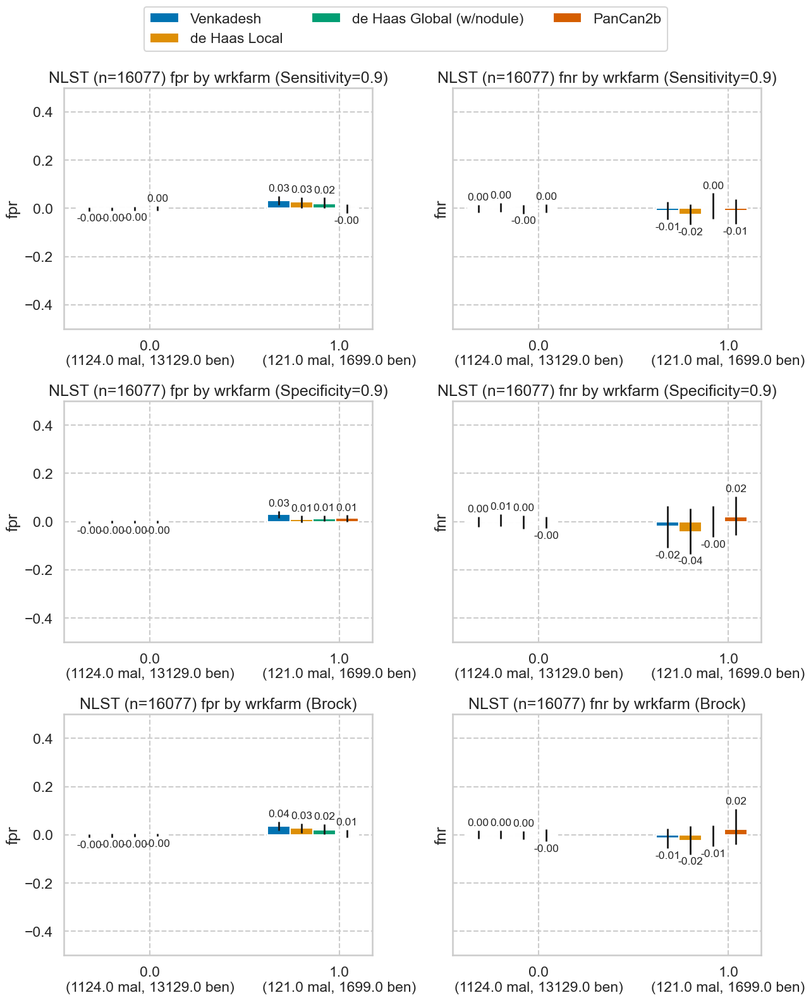

### wrkcoal

,num,pct,mal,ben,pct_mal
0.0,15994,99.483735,1241,14753,7.759160
1.0,82,0.510045,7,75,8.536585


### wrkpain

,num,pct,mal,ben,pct_mal
0.0,15262,94.930646,1171,14091,7.672651
1.0,814,5.063134,77,737,9.459459


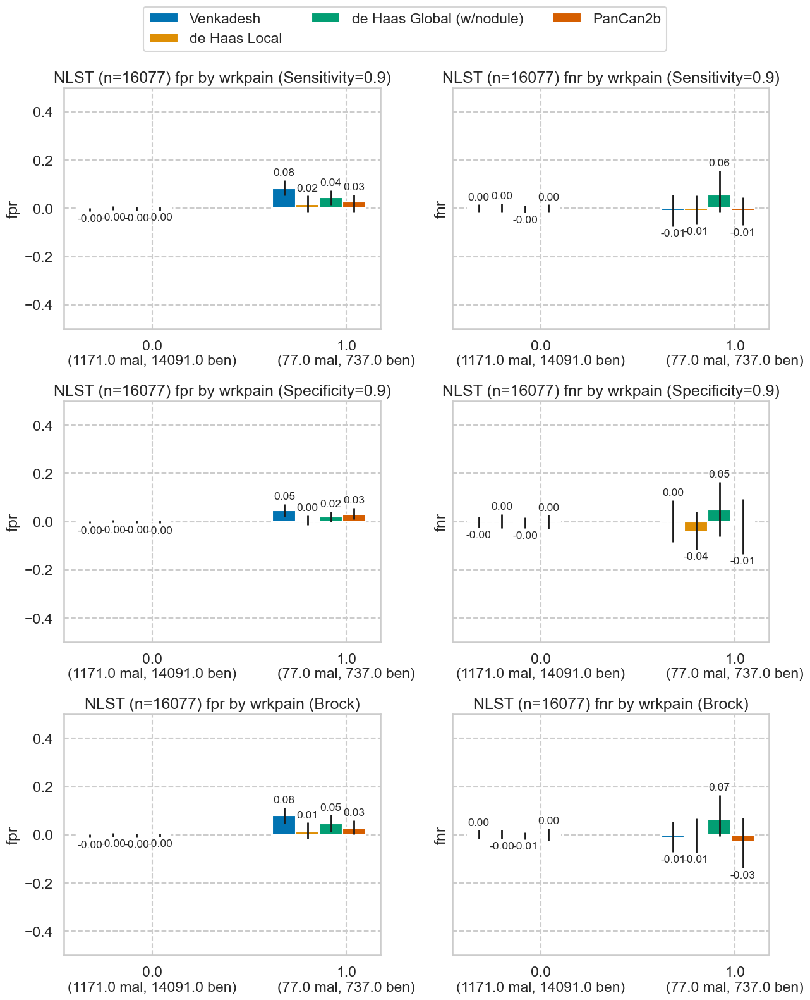

### wrkweld

,num,pct,mal,ben,pct_mal
0.0,15145,94.202899,1159,13986,7.652691
1.0,931,5.790881,89,842,9.559613


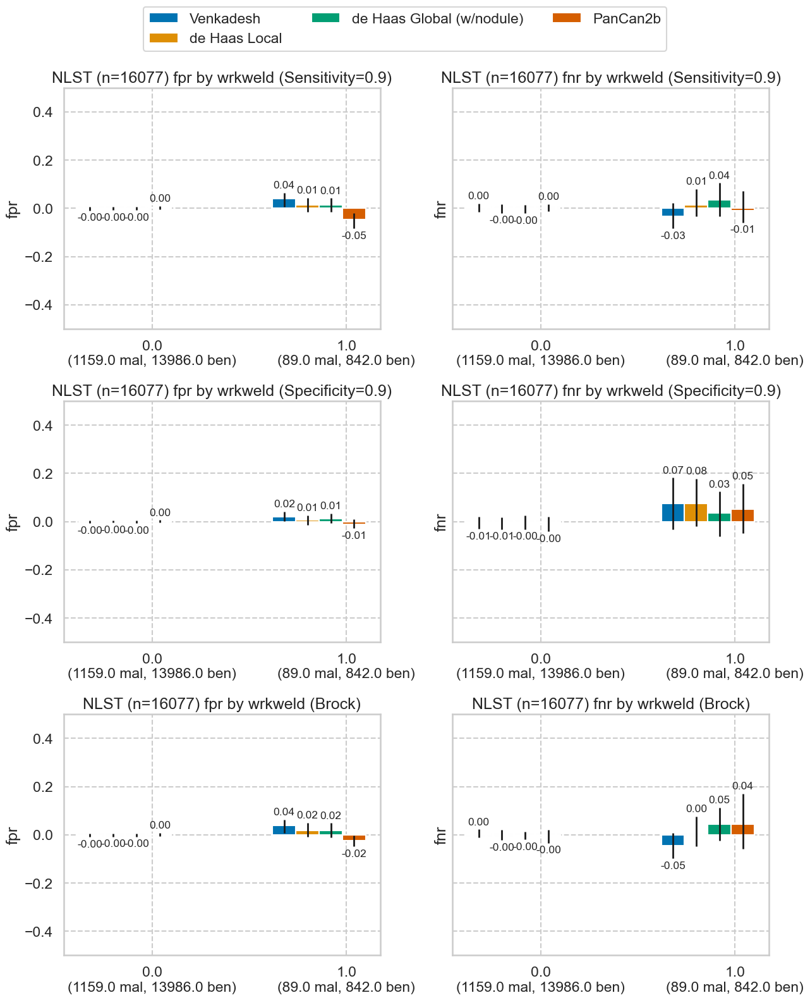

### wrkflou

,num,pct,mal,ben,pct_mal
0.0,15926,99.06077,1230,14696,7.72322
1.0,150,0.93301,18,132,12.00000


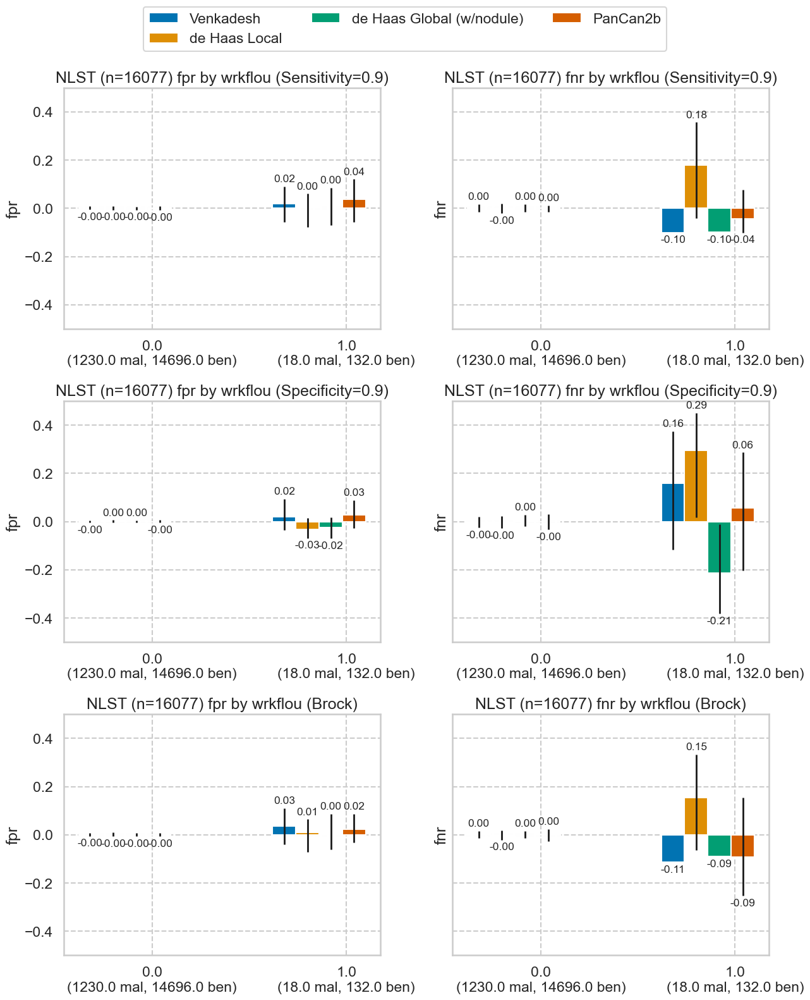

### wrkbutc

,num,pct,mal,ben,pct_mal
0.0,15780,98.15264,1223,14557,7.750317
1.0,296,1.84114,25,271,8.445946


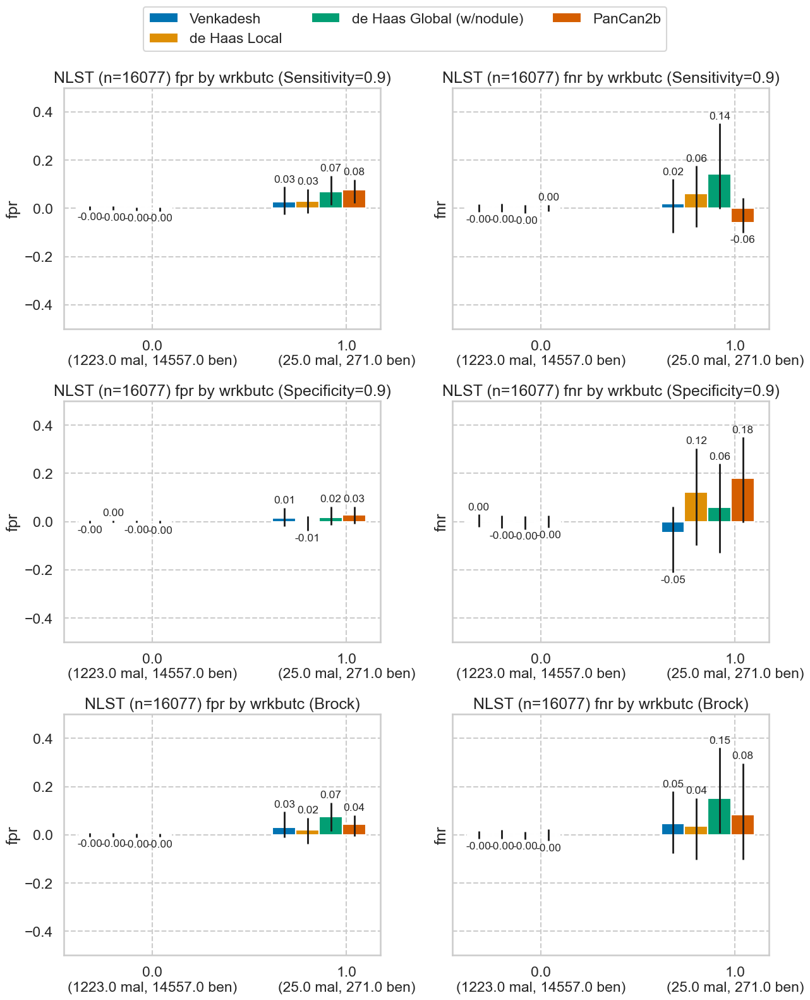

### wrkhard

,num,pct,mal,ben,pct_mal
0.0,15957,99.253592,1245,14712,7.802218
1.0,119,0.740188,3,116,2.521008


### wrkcott

,num,pct,mal,ben,pct_mal
0.0,15950,99.210052,1232,14718,7.724138
1.0,126,0.783728,16,110,12.698413


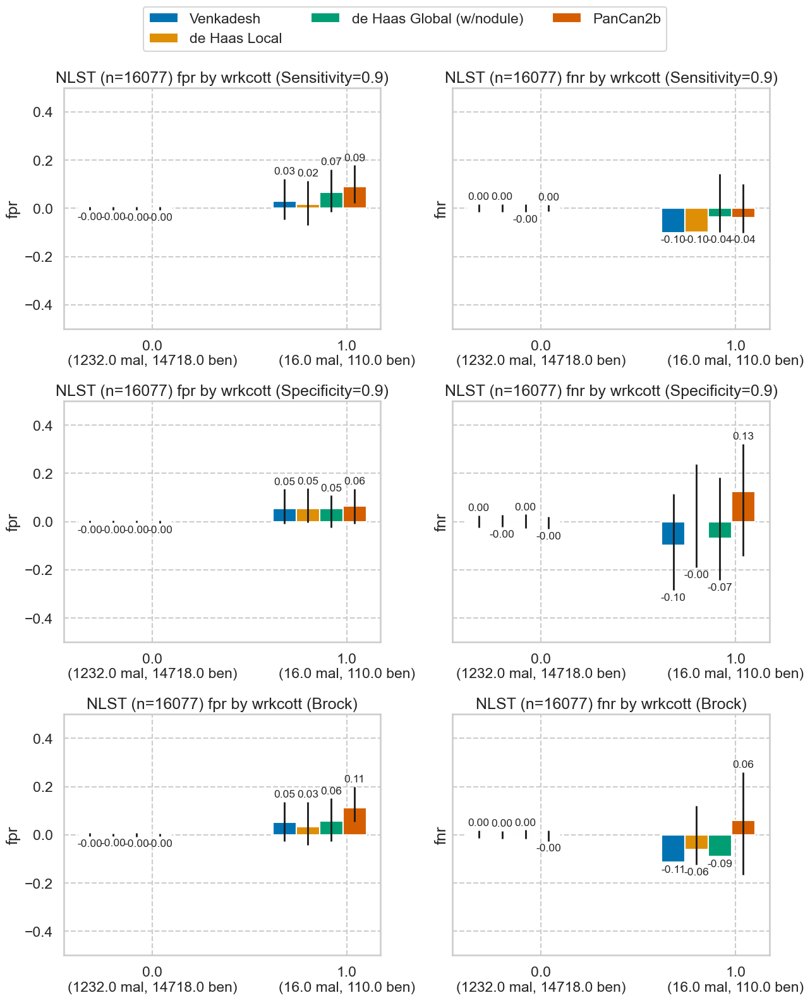

In [16]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Lung cancer type

### LC_stage

,num,pct,mal,ben,pct_mal
110.0,625,3.887541,625,0,100.0
120.0,113,0.702867,113,0,100.0
210.0,86,0.534926,86,0,100.0
220.0,42,0.261243,42,0,100.0
310.0,141,0.877029,141,0,100.0
320.0,31,0.192822,31,0,100.0
400.0,176,1.094732,176,0,100.0
900.0,4,0.024880,4,0,100.0


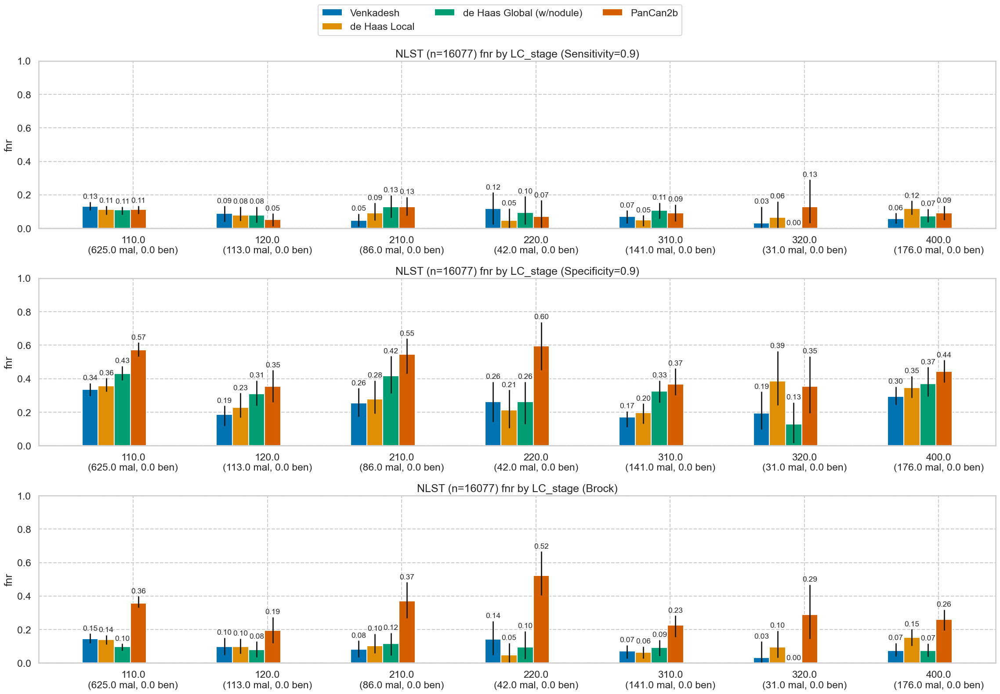

### Adenosquamous_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,16051,99.838278,1223,14828,7.619463
True,26,0.161722,26,0,100.000000


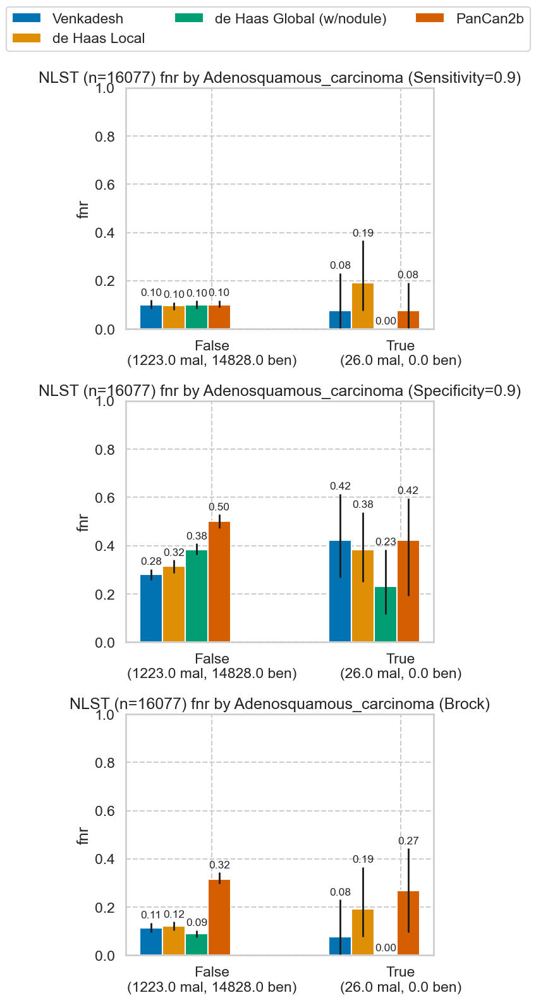

### Small_cell_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,16027,99.688997,1199,14828,7.481126
True,50,0.311003,50,0,100.000000


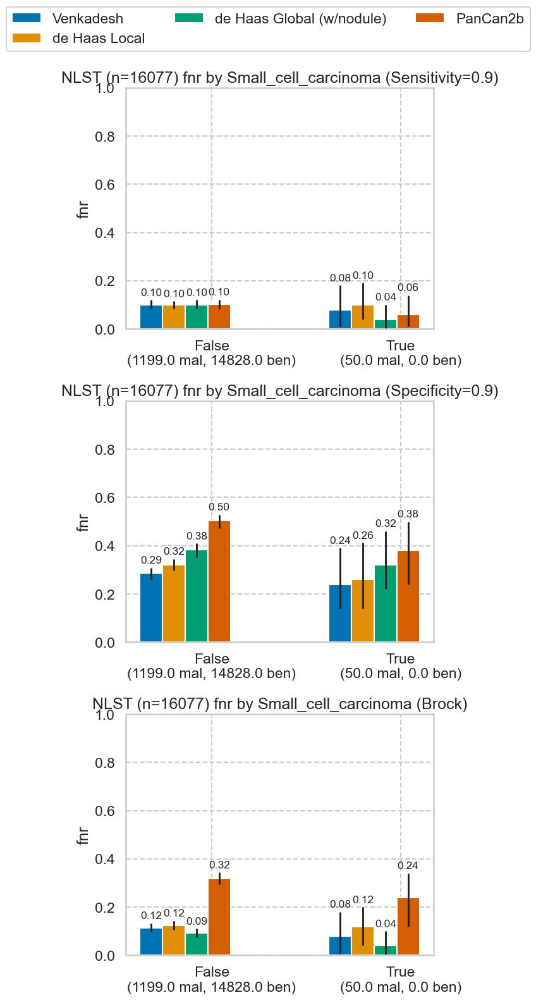

### Bronchiolo-alveolar_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,15891,98.843068,1063,14828,6.689321
True,186,1.156932,186,0,100.000000


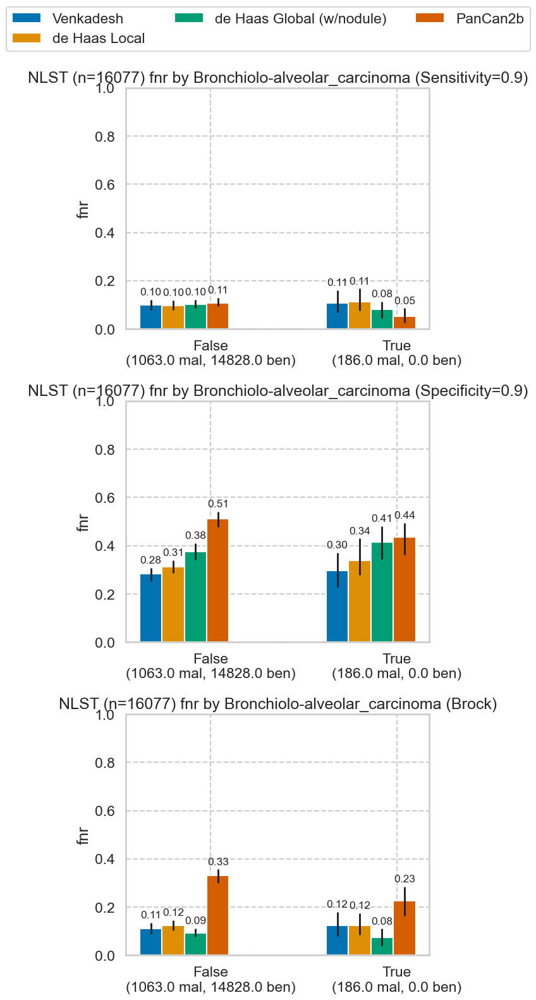

### Carcinoid_tumor

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,16070,99.95646,1242,14828,7.728687
True,7,0.04354,7,0,100.000000


### Adenocarcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,15516,96.510543,688,14828,4.434133
True,561,3.489457,561,0,100.000000


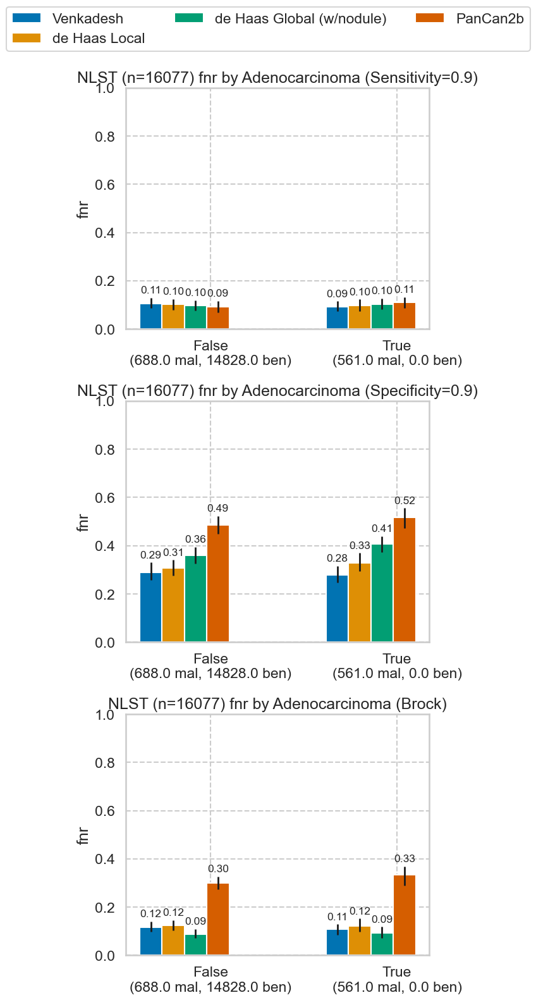

### Squamous_cell_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,15833,98.482304,1005,14828,6.347502
True,244,1.517696,244,0,100.000000


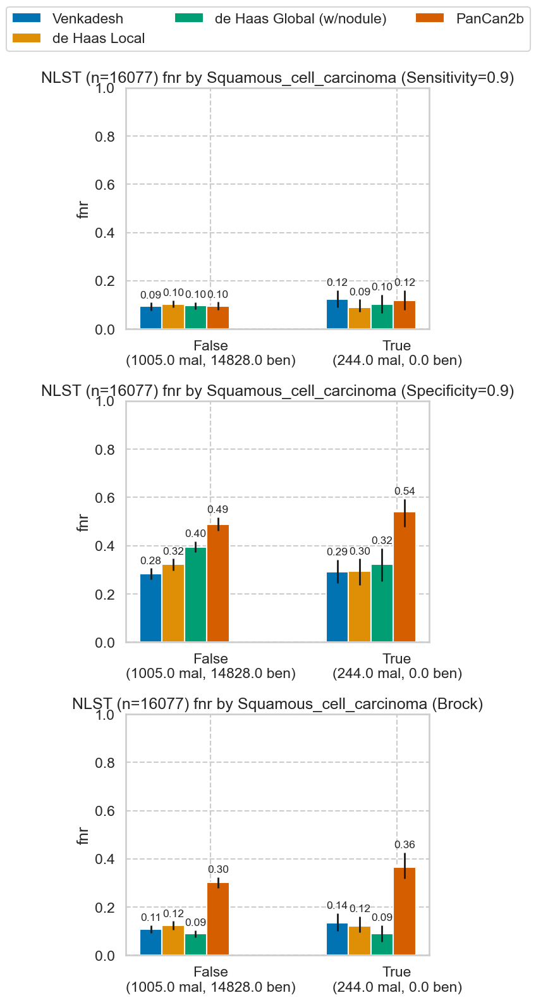

### Unclassified_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,15953,99.228712,1125,14828,7.051965
True,124,0.771288,124,0,100.000000


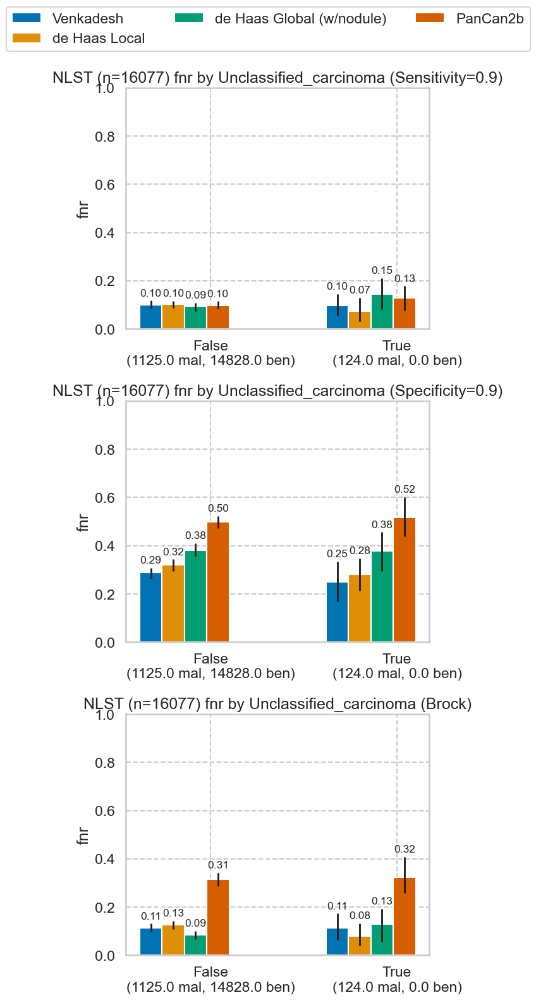

### Large_cell_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,16037,99.751197,1209,14828,7.538816
True,40,0.248803,40,0,100.000000


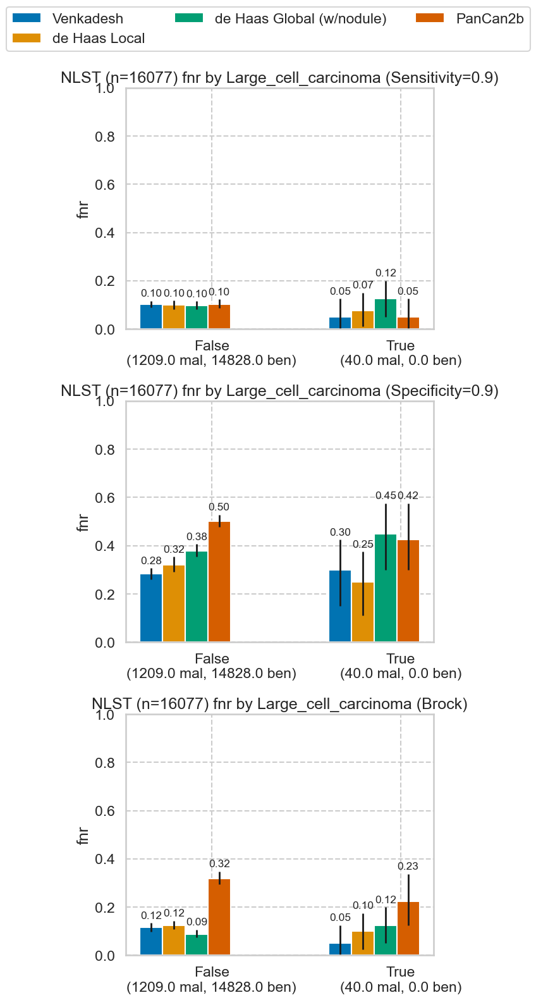

In [17]:
for cat in nlst_democols['cat']['lungcanc']:
    plot_by_category(nlst_preds, cat, metrics_to_plot=['fnr'], diff=False)

### Disease history

### diagasbe

,num,pct,mal,ben,pct_mal
0.0,15884,98.799527,1236,14648,7.781415
1.0,175,1.088512,12,163,6.857143


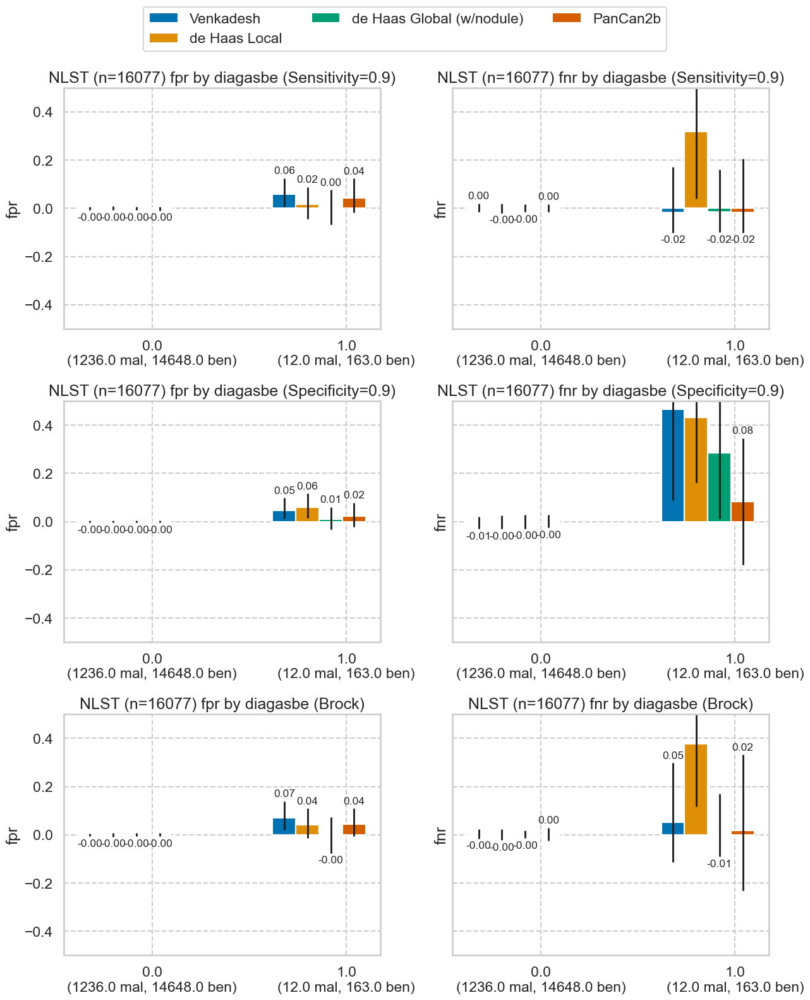

### diagchas

,num,pct,mal,ben,pct_mal
0.0,15486,96.323941,1222,14264,7.890998
1.0,573,3.564098,26,547,4.537522


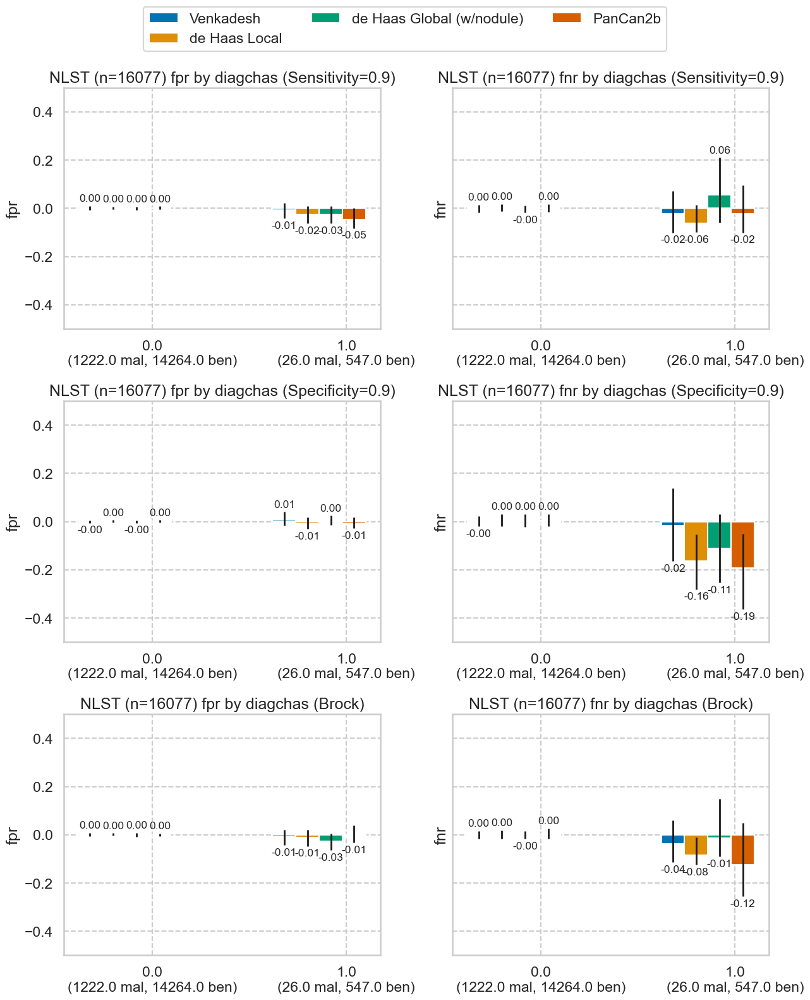

### diagpneu

,num,pct,mal,ben,pct_mal
0.0,12297,76.488151,946,11351,7.692933
1.0,3756,23.362568,296,3460,7.880724


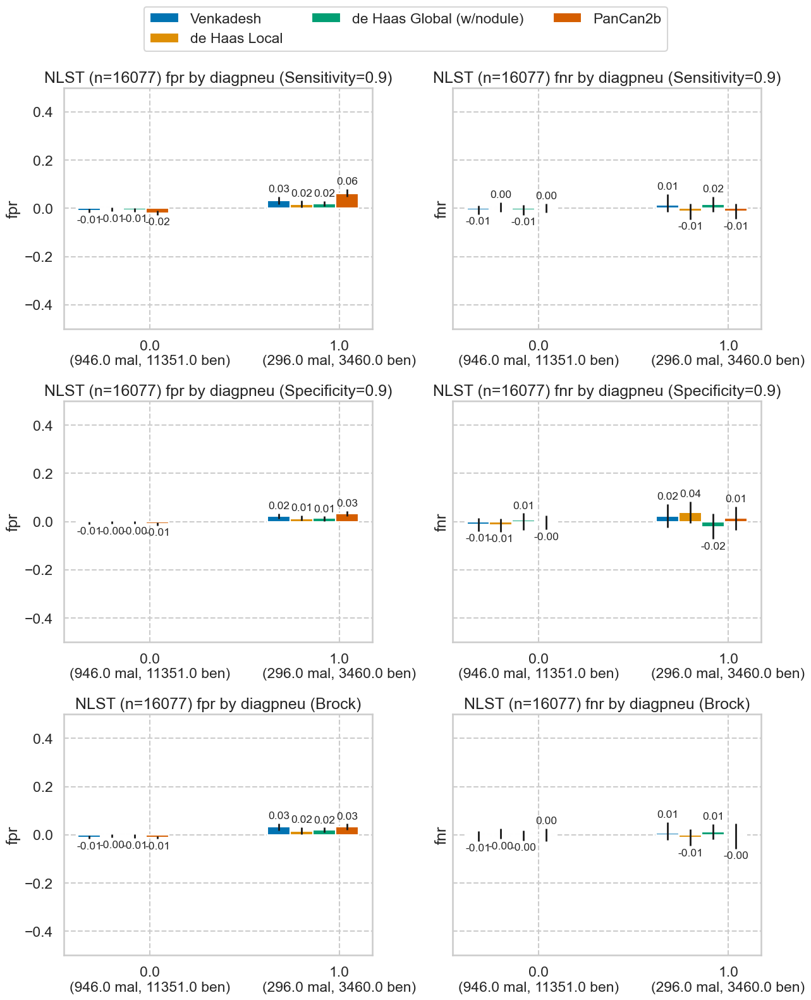

### diagstro

,num,pct,mal,ben,pct_mal
0.0,15599,97.026808,1205,14394,7.724854
1.0,463,2.879891,43,420,9.287257


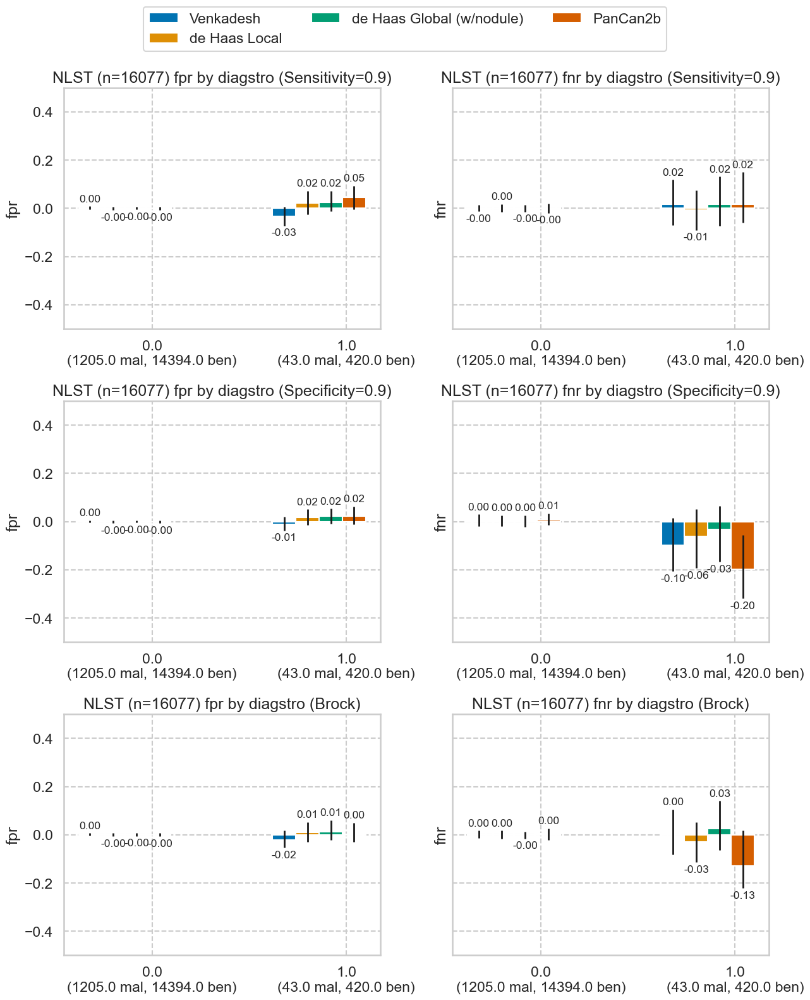

### diagemph

,num,pct,mal,ben,pct_mal
0.0,14283,88.841202,1090,13193,7.631450
1.0,1755,10.916216,156,1599,8.888889


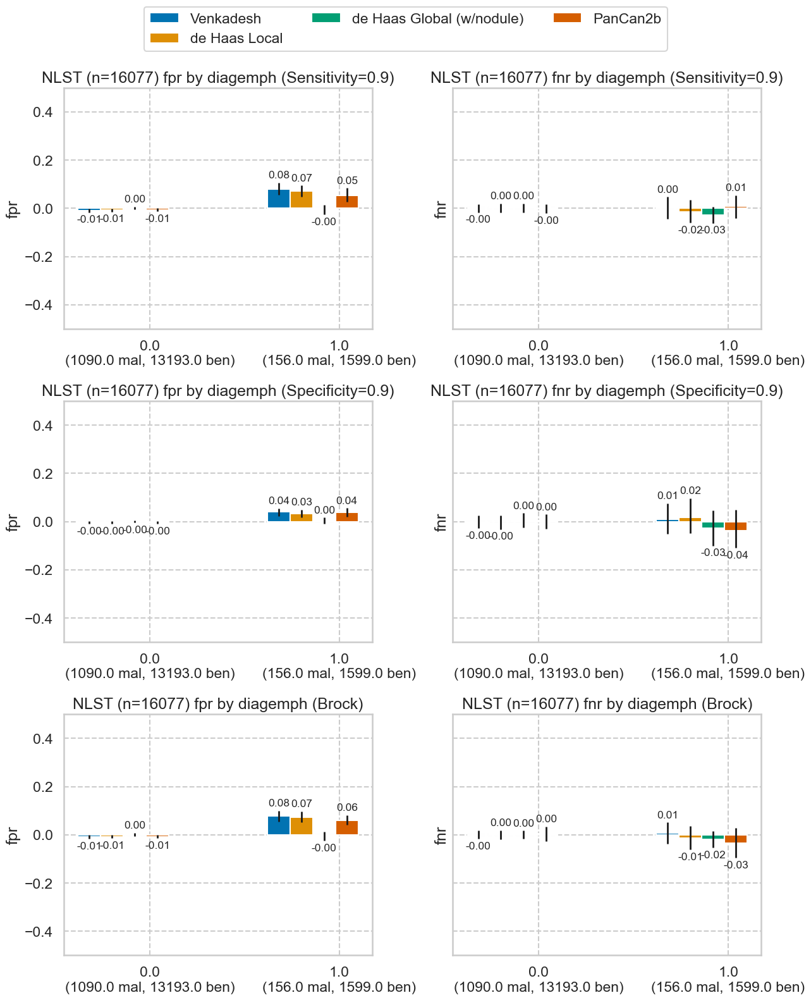

### diagbron

,num,pct,mal,ben,pct_mal
0.0,15481,96.292841,1214,14267,7.841871
1.0,553,3.439696,28,525,5.063291


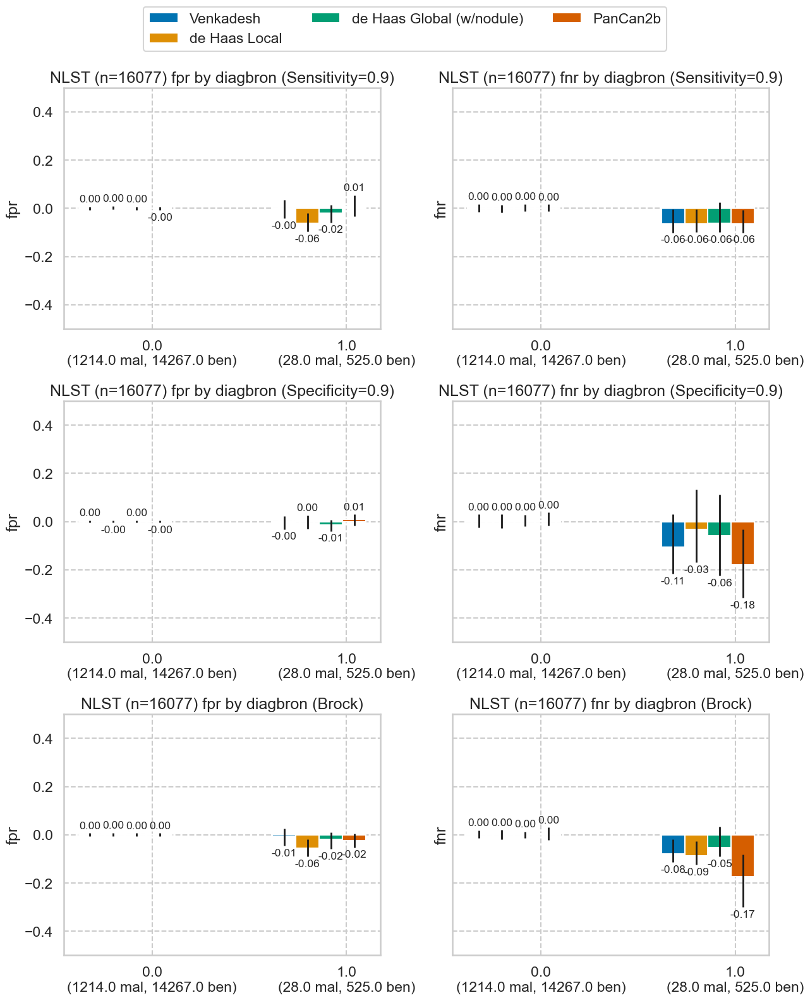

### diagsili

,num,pct,mal,ben,pct_mal
0.0,16030,99.707657,1242,14788,7.747973
1.0,20,0.124401,4,16,20.000000


### diagsarc

,num,pct,mal,ben,pct_mal
0.0,16021,99.651676,1241,14780,7.746083
1.0,29,0.180382,5,24,17.241379


### diaghear

,num,pct,mal,ben,pct_mal
0.0,13869,86.266094,1067,12802,7.693417
1.0,2159,13.429122,179,1980,8.290875


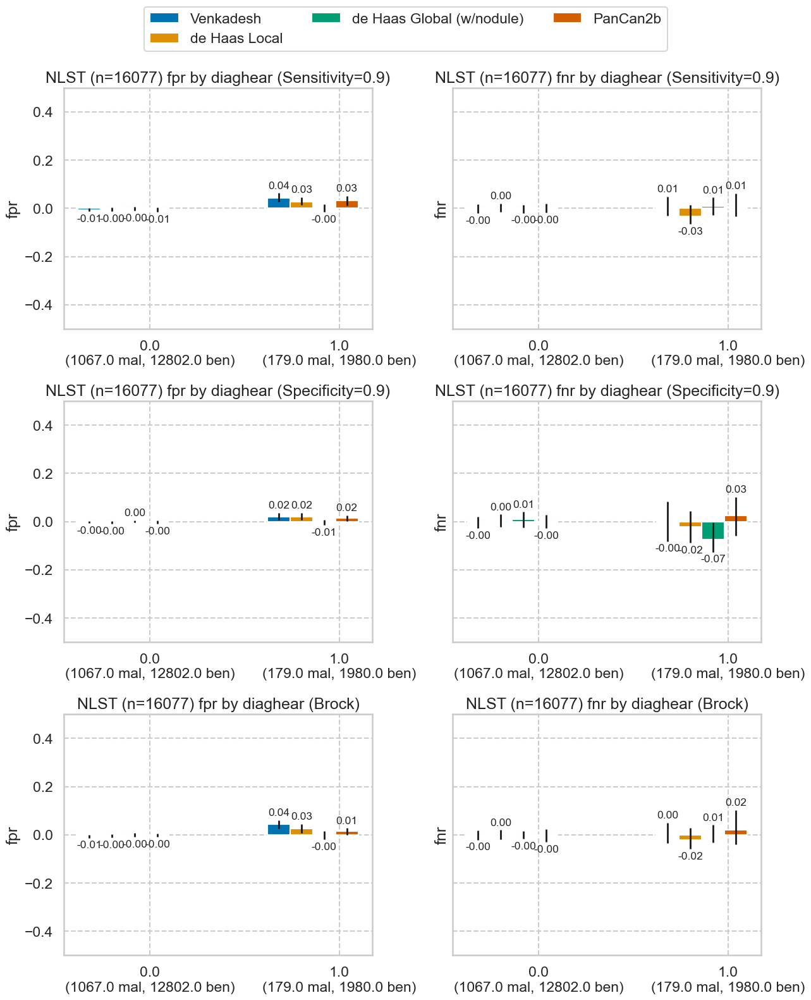

### diagdiab

,num,pct,mal,ben,pct_mal
0.0,14428,89.743111,1123,13305,7.783477
1.0,1632,10.151148,125,1507,7.659314


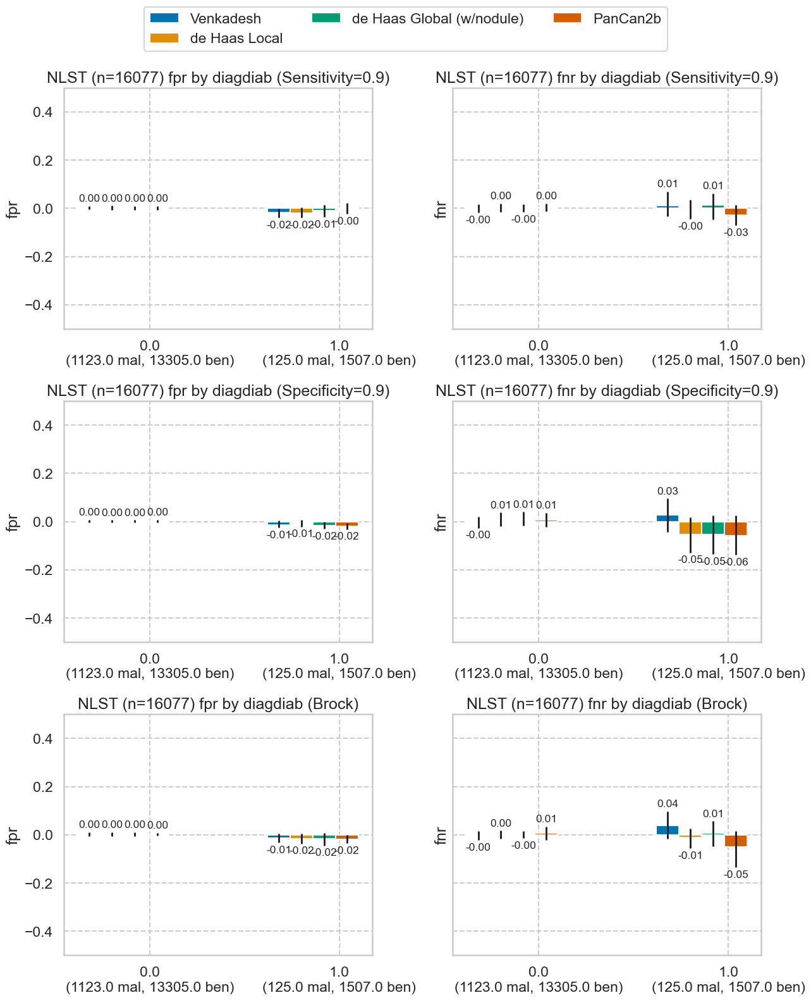

### diagadas

,num,pct,mal,ben,pct_mal
0.0,15015,93.394290,1159,13856,7.718948
1.0,1038,6.456428,85,953,8.188825


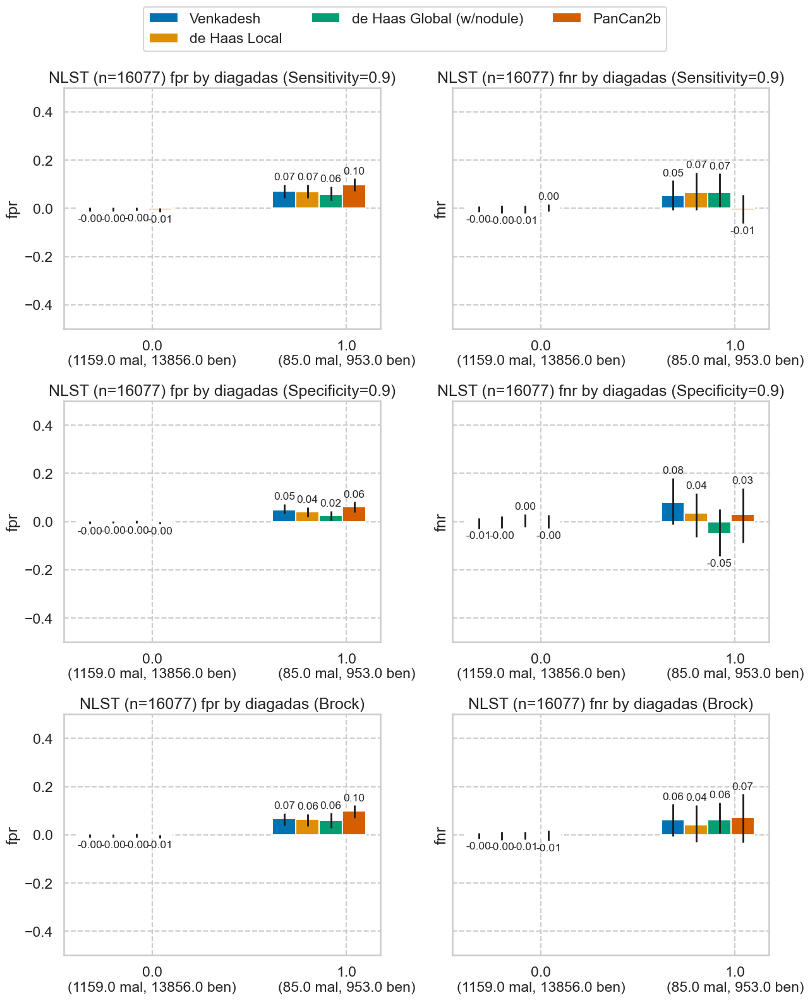

### diagcopd

,num,pct,mal,ben,pct_mal
0.0,14905,92.710083,1122,13783,7.527675
1.0,1131,7.034895,124,1007,10.963749


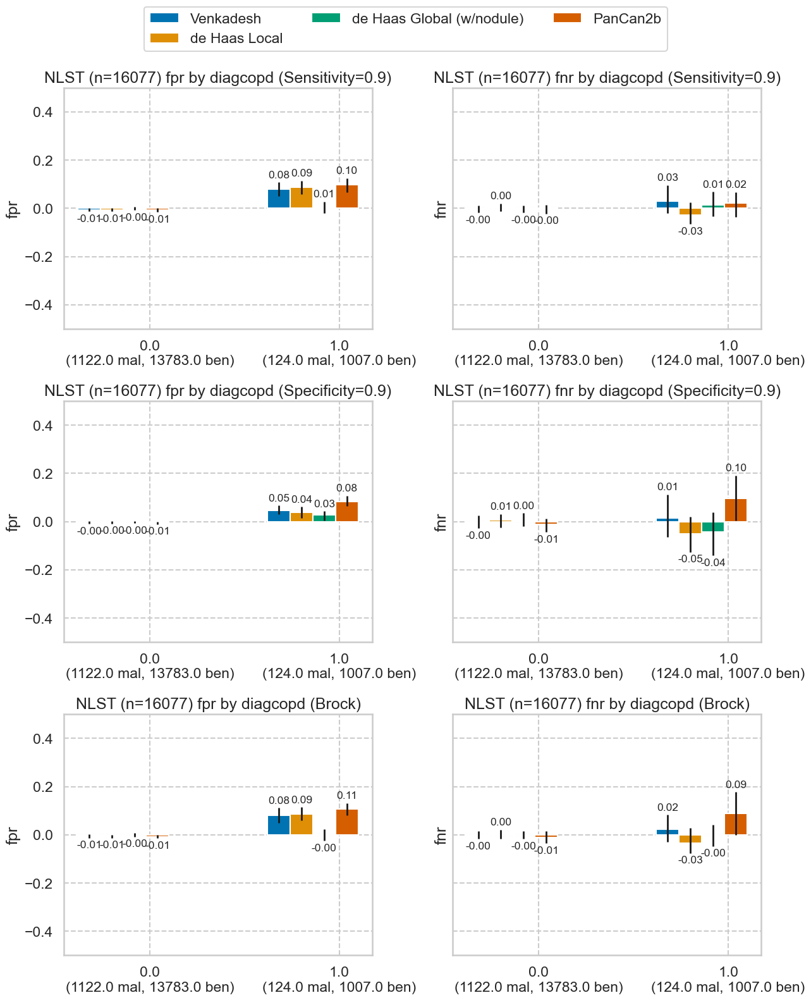

### diagfibr

,num,pct,mal,ben,pct_mal
0.0,16016,99.620576,1243,14773,7.760989
1.0,40,0.248803,5,35,12.500000


### diagtube

,num,pct,mal,ben,pct_mal
0.0,15892,98.849288,1231,14661,7.746036
1.0,166,1.032531,14,152,8.433735


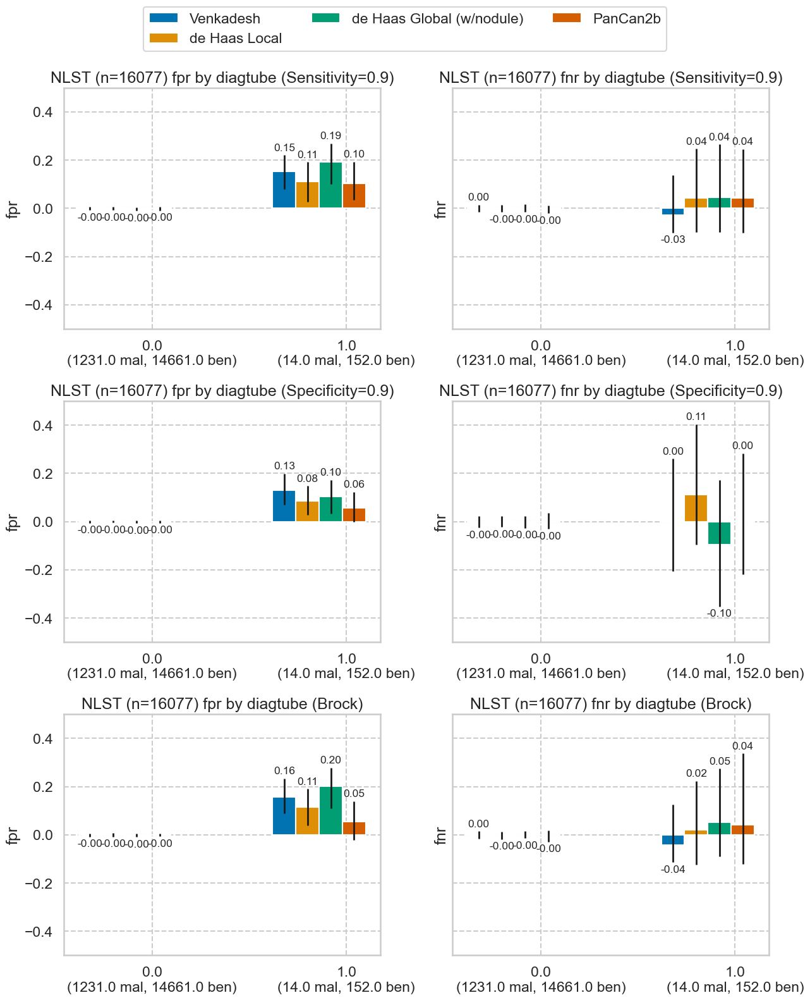

### diaghype

,num,pct,mal,ben,pct_mal
0.0,10489,65.242272,798,9691,7.607970
1.0,5558,34.571126,445,5113,8.006477


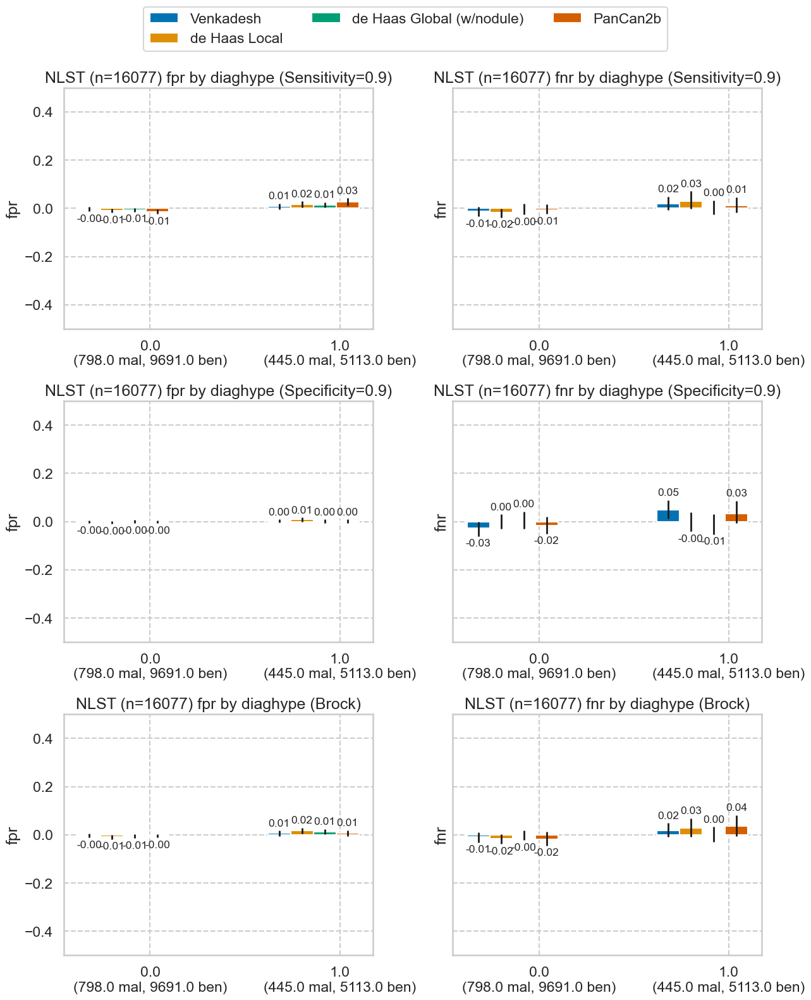

### diagchro

,num,pct,mal,ben,pct_mal
0.0,14279,88.816321,1125,13154,7.878703
1.0,1750,10.885115,116,1634,6.628571


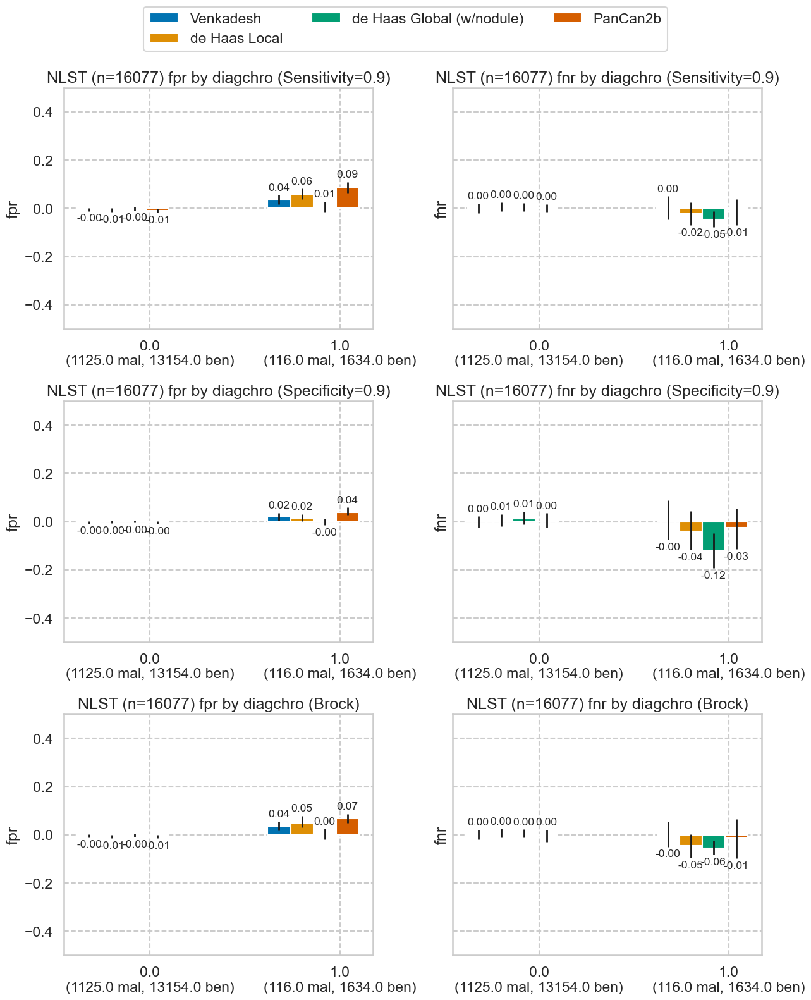

In [18]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

C:\Users\shaur\AppData\Local\Temp\ipykernel_268\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                          \
                               count      mean       std  min  25%  50%  75%   
bin_BMI                                                                        
(13.283000000000001, 27.044]  8041.0  0.090785  0.287321  0.0  0.0  0.0  0.0   
(27.044, 65.0]                7993.0  0.063931  0.244645  0.0  0.0  0.0  0.0   

                                      BMI                                  \
                              max   count       mean       std        min   
bin_BMI                                                                     
(13.283000000000001, 27.044]  1.0  8041.0  23.853009  2.252776  13.284203   
(27.044, 65.0]                1.0  7993.0  31.491890  3.911877  27.054553   

                                                                          
                                    25%        50%        75%        max  
bin_BMI                                                                   
(13.283000000000001, 27.044]  22.466216  24.273780  25.744629  27.043535  
(27.044, 65.0]                28.588574  30.406574  33.278107  65.000416

### bin_BMI

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\data.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,mal,ben,pct_mal
"(13.283000000000001, 27.044]",8041,50.015550,730,7311,9.078473
"(27.044, 65.0]",7993,49.716987,511,7482,6.393094


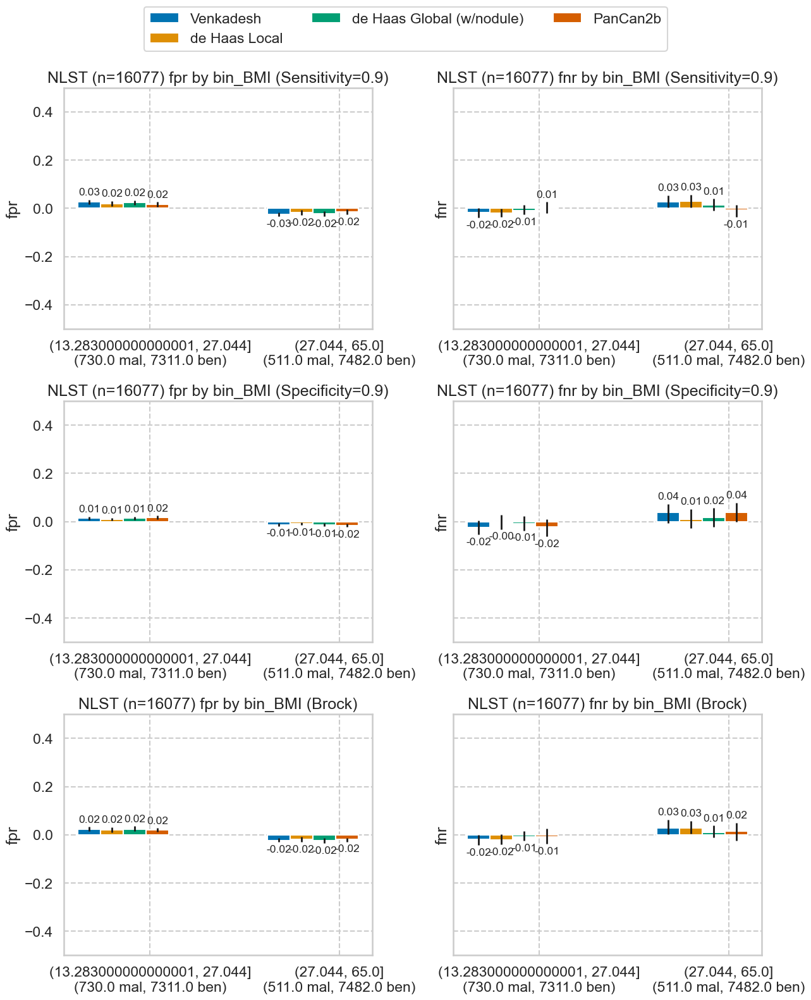

C:\Users\shaur\AppData\Local\Temp\ipykernel_268\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                  Age  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_Age                                                                       
(53.999, 63.0]  8889.0  0.065587  0.247572  0.0  0.0  0.0  0.0  1.0  8889.0   
(63.0, 76.0]    7188.0  0.092654  0.289968  0.0  0.0  0.0  0.0  1.0  7188.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_Age                                                            
(53.999, 63.0]  59.273034  2.373779  54.0  57.0  59.0  61.0  63.0  
(63.0, 76.0]    68.253339  3.195797  64.0  65.0  68.0  71.0  76.0

### bin_Age

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\data.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,mal,ben,pct_mal
"(53.999, 63.0]",8889,55.290166,583,8306,6.558668
"(63.0, 76.0]",7188,44.709834,666,6522,9.265442


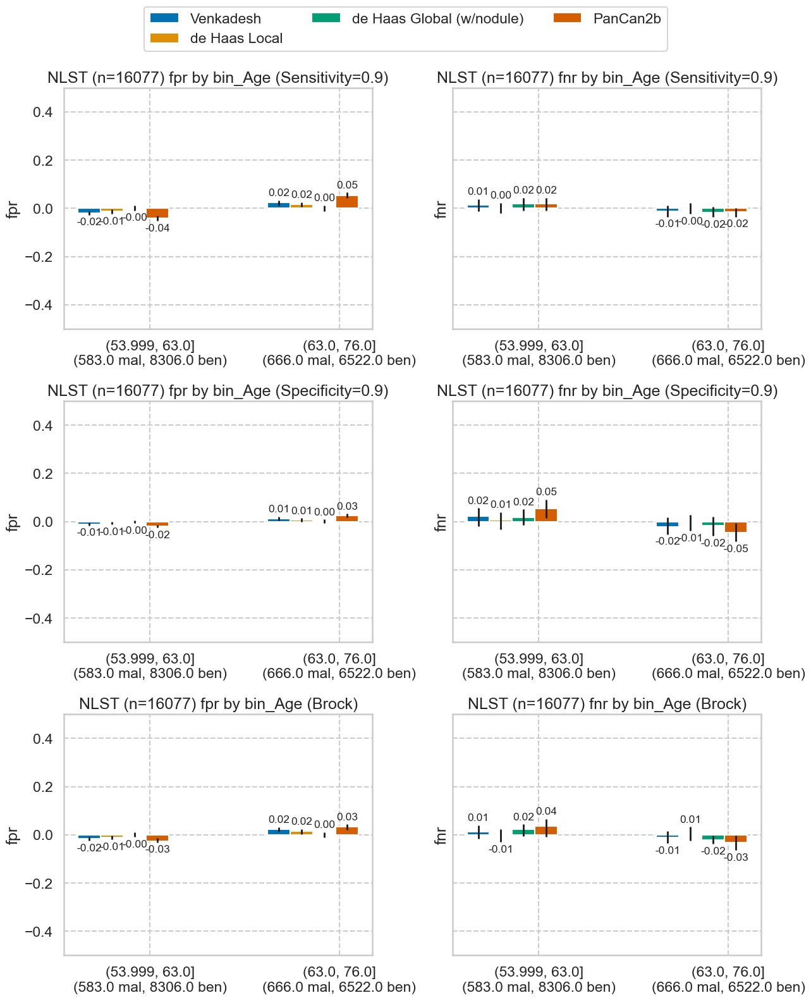

C:\Users\shaur\AppData\Local\Temp\ipykernel_268\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               height  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                    
(48.999, 68.0]  8587.0  0.079189  0.270050  0.0  0.0  0.0  0.0  1.0  8587.0   
(68.0, 83.0]    7467.0  0.075800  0.264696  0.0  0.0  0.0  0.0  1.0  7467.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(48.999, 68.0]  64.916385  2.371898  49.0  63.0  65.0  67.0  68.0  
(68.0, 83.0]    71.468997  1.931785  69.0  70.0  71.0  73.0  83.0

### bin_height

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\data.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,mal,ben,pct_mal
"(48.999, 68.0]",8587,53.411706,680,7907,7.918947
"(68.0, 83.0]",7467,46.445232,566,6901,7.580019


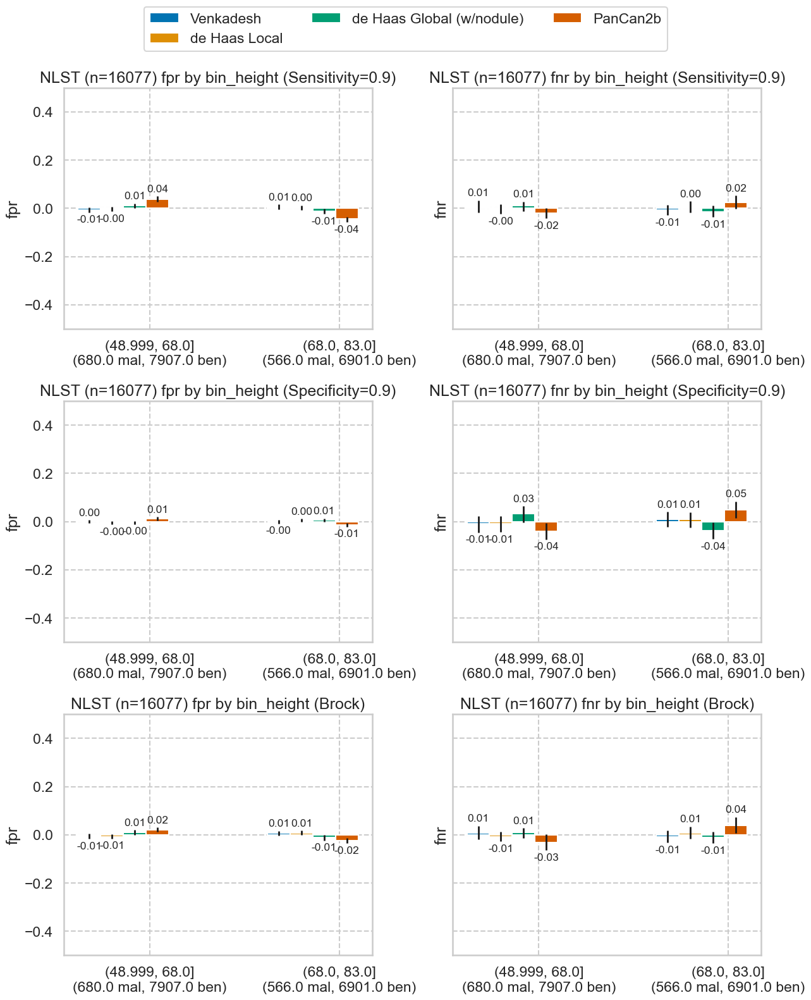

C:\Users\shaur\AppData\Local\Temp\ipykernel_268\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               weight  \
                  count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                     
(74.999, 180.0]  8450.0  0.087692  0.282864  0.0  0.0  0.0  0.0  1.0  8450.0   
(180.0, 368.0]   7592.0  0.066122  0.248512  0.0  0.0  0.0  0.0  1.0  7592.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(74.999, 180.0]  153.189704  19.743068   75.0  140.0  156.0  170.0  180.0  
(180.0, 368.0]   214.944942  27.395028  181.0  194.0  209.0  230.0  368.0

### bin_weight

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\data.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,mal,ben,pct_mal
"(74.999, 180.0]",8450,52.559557,741,7709,8.769231
"(180.0, 368.0]",7592,47.222741,502,7090,6.612223


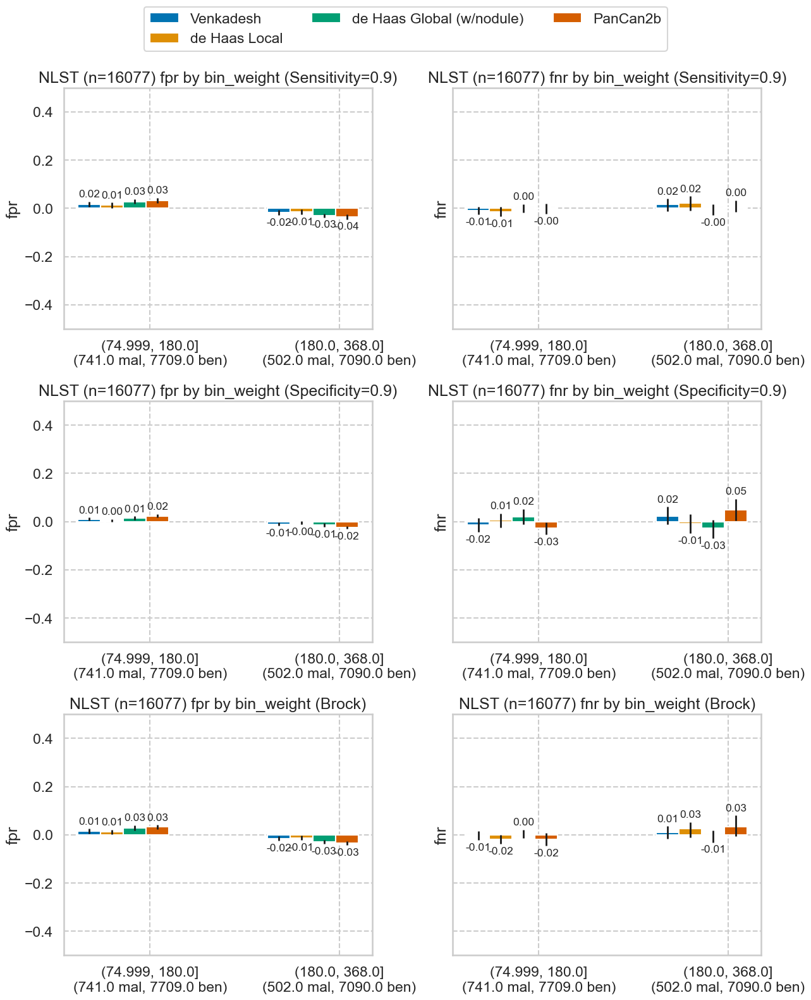

In [19]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

C:\Users\shaur\AppData\Local\Temp\ipykernel_268\2670985764.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bmi_classes')[['label', 'BMI']].describe())


label                                                   BMI  \
               count      mean       std  min  25%  50%  75%  max    count   
bmi_classes                                                                  
[0, 25)       5019.0  0.087069  0.281964  0.0  0.0  0.0  0.0  1.0   5019.0   
[25, 100)    11015.0  0.072991  0.260134  0.0  0.0  0.0  0.0  1.0  11015.0   

                                                                              \
                  mean       std        min        25%        50%        75%   
bmi_classes                                                                    
[0, 25)      22.559527  1.859851  13.284203  21.453857  22.998535  24.030391   
[25, 100)    29.985516  4.148062  25.014922  26.779696  29.049587  32.074985   

                        
                   max  
bmi_classes             
[0, 25)      24.995556  
[25, 100)    65.000416

### bmi_classes

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\data.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,mal,ben,pct_mal
"[0, 25)",5019,31.218511,437,4582,8.706914
"[25, 100)",11015,68.514026,804,10211,7.299138


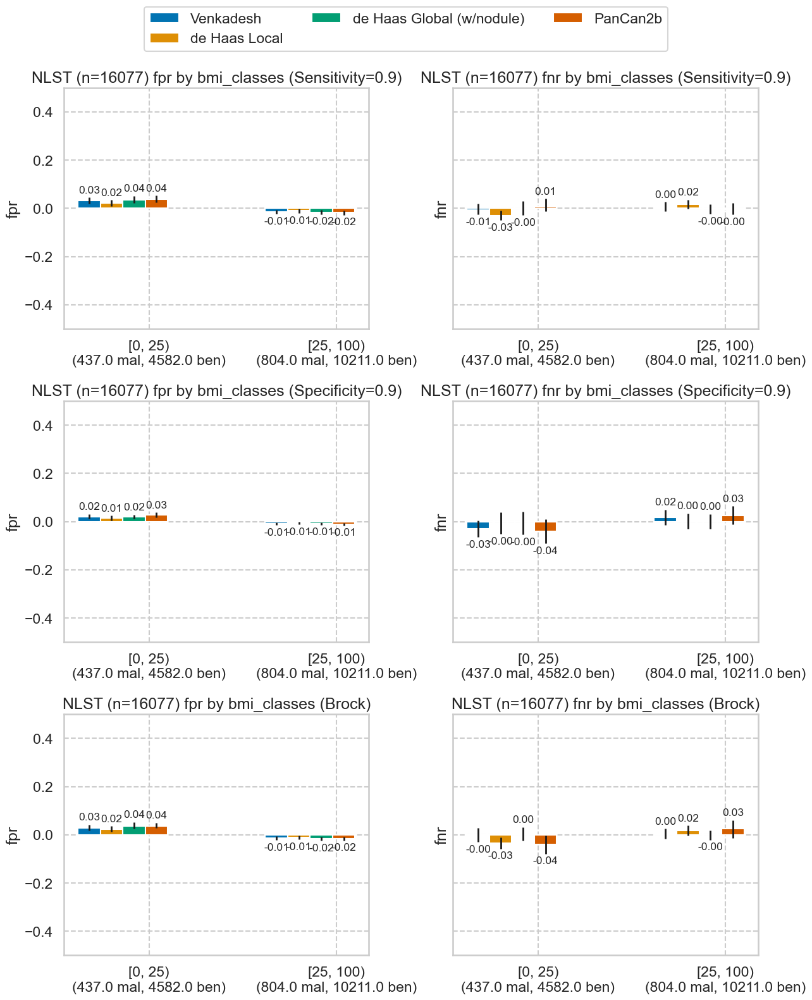

In [20]:
nlst_preds['bmi_classes'] = pd.cut(nlst_preds['BMI'], bins=[0, 
                                                            # 18.5, 
                                                            25, 
                                                            # 30, 
                                                            100], right=False)
display(nlst_preds.groupby('bmi_classes')[['label', 'BMI']].describe())
plot_by_category(nlst_preds, f'bmi_classes')

### Smoking columns

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,16.600958,3.496058,4.0,15.0,16.0,18.0,40.0
1,1249.0,16.223379,3.369913,6.0,14.0,16.0,18.0,33.0


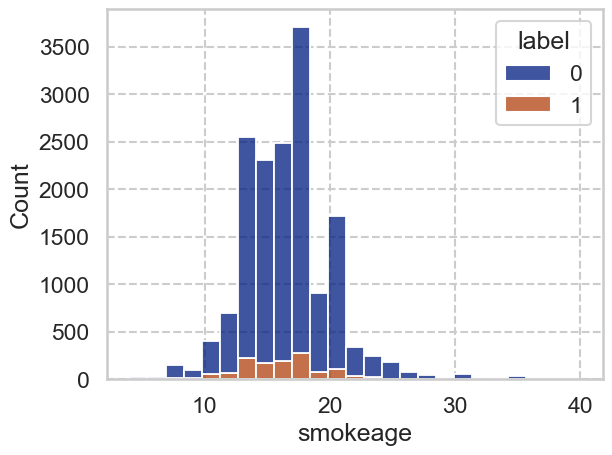

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,28.468843,11.351092,12.0,20.0,25.0,30.0,135.0
1,1249.0,29.903122,12.194579,15.0,20.0,30.0,40.0,100.0


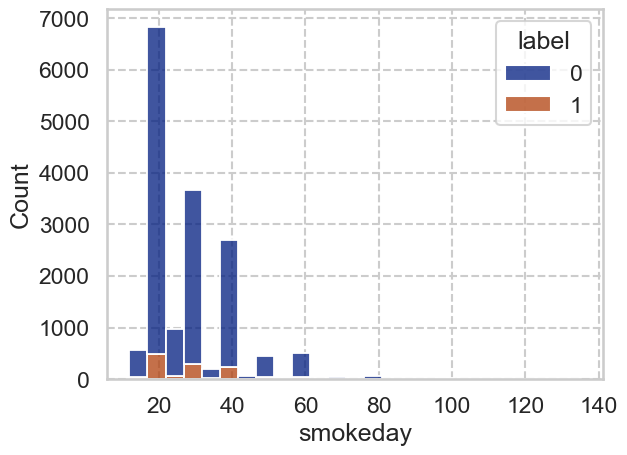

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,40.914621,7.379901,13.0,36.0,41.0,46.0,67.0
1,1249.0,43.640512,7.275904,15.0,39.0,44.0,49.0,65.0


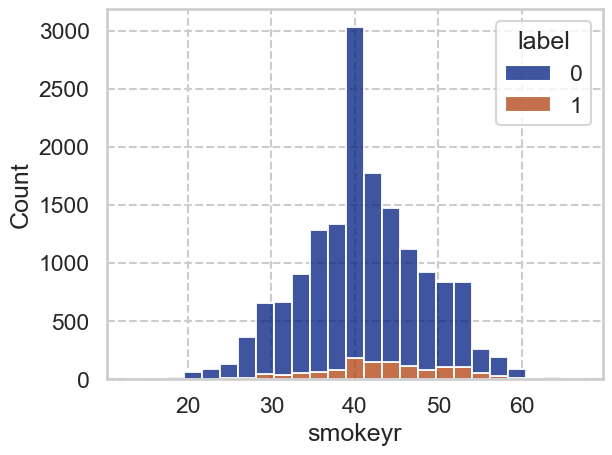

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,57.575910,23.991348,30.0,40.0,50.0,68.0,260.0
1,1249.0,64.501841,27.541166,30.0,45.0,56.0,78.0,232.0


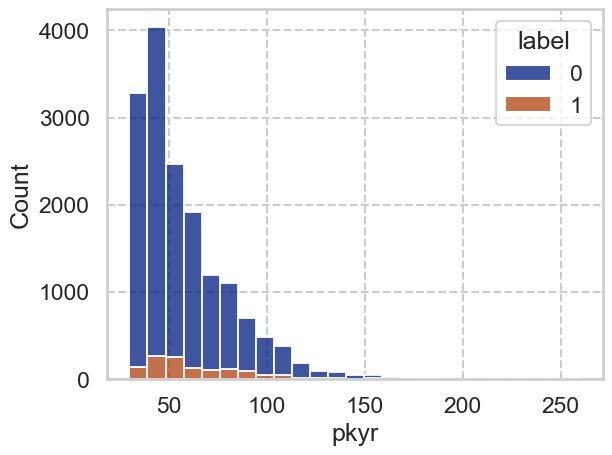

In [21]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                              smokeage  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                 
0             8738.0  0.082856  0.275681  0.0  0.0  0.0  0.0  1.0   8738.0   
1             7339.0  0.071536  0.257735  0.0  0.0  0.0  0.0  1.0   7339.0   

                                                                 
                   mean       std   min   25%   50%   75%   max  
bin_smokeage                                                     
0             14.191577  1.929373   4.0  13.0  15.0  16.0  16.0  
1             19.405369  2.727894  17.0  18.0  18.0  20.0  40.0

### bin_smokeage

,num,pct,mal,ben,pct_mal
0,8738,54.350936,724,8014,8.285649
1,7339,45.649064,525,6814,7.153563


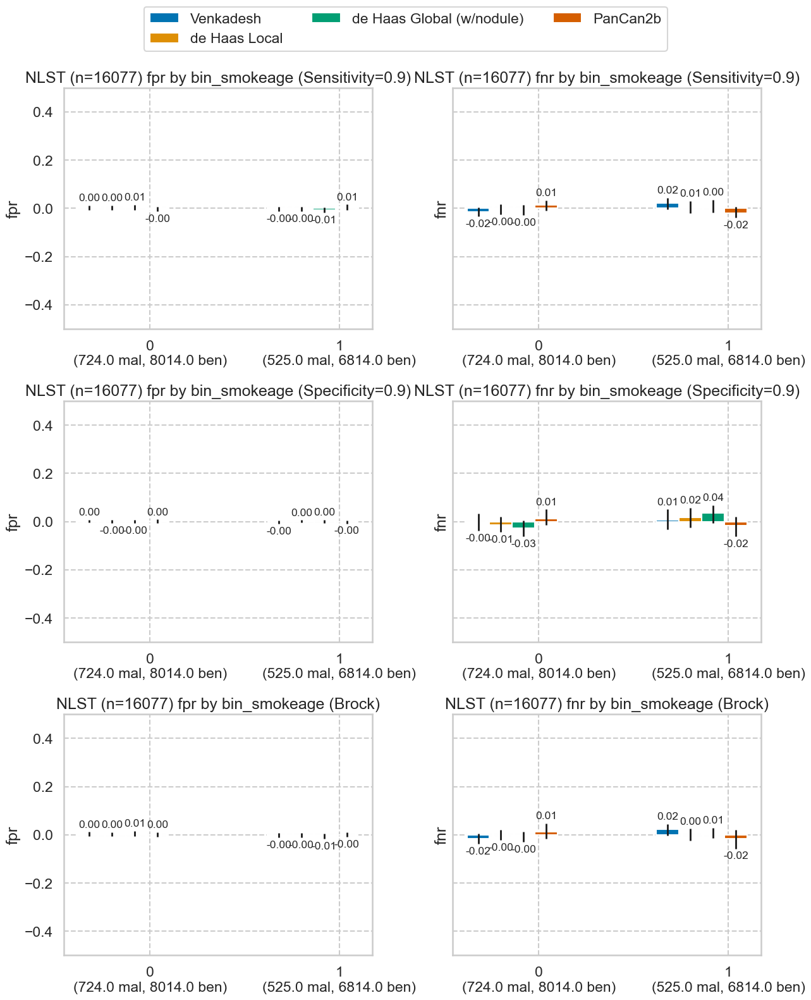

label                                              smokeday  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                 
0             8347.0  0.070325  0.255709  0.0  0.0  0.0  0.0  1.0   8347.0   
1             7730.0  0.085640  0.279850  0.0  0.0  0.0  0.0  1.0   7730.0   

                                                                   
                   mean        std   min   25%   50%   75%    max  
bin_smokeday                                                       
0             20.138493   2.162074  12.0  20.0  20.0  20.0   25.0  
1             37.695860  10.314049  26.0  30.0  35.0  40.0  135.0

### bin_smokeday

,num,pct,mal,ben,pct_mal
0,8347,51.91889,587,7760,7.032467
1,7730,48.08111,662,7068,8.564036


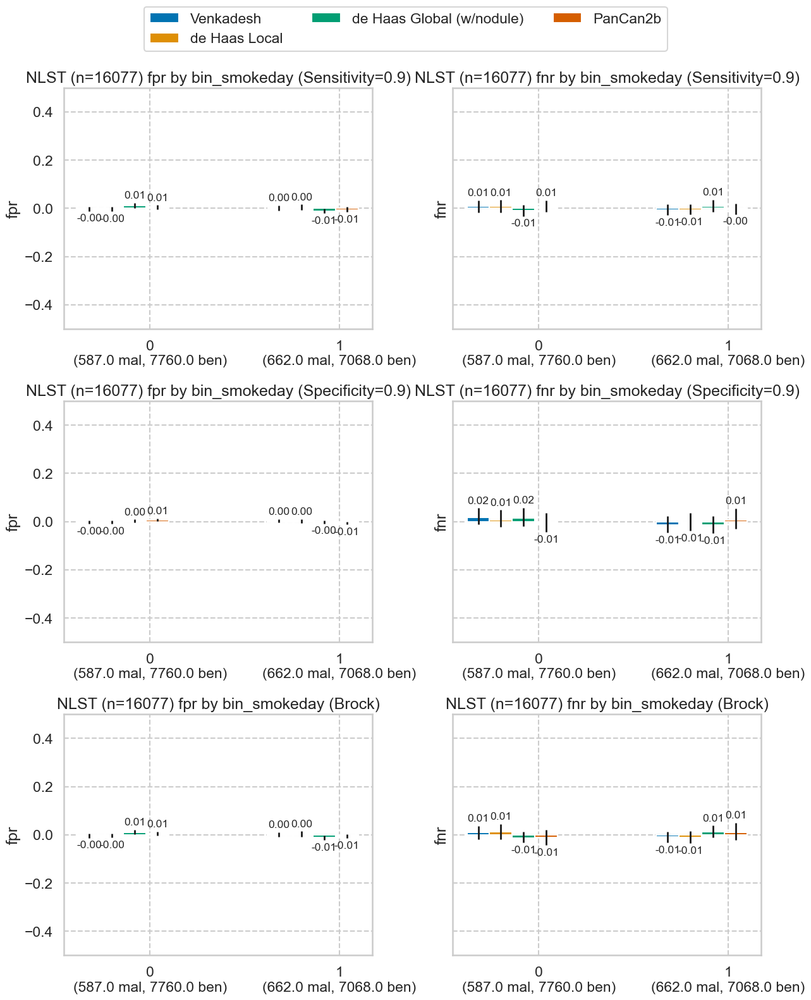

label                                              smokeyr  \
              count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                
0            8536.0  0.054709  0.227426  0.0  0.0  0.0  0.0  1.0  8536.0   
1            7541.0  0.103700  0.304891  0.0  0.0  0.0  0.0  1.0  7541.0   

                                                                
                  mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                     
0            35.634372  4.652643  13.0  33.0  37.0  40.0  41.0  
1            47.343058  4.437744  42.0  44.0  46.0  50.0  67.0

### bin_smokeyr

,num,pct,mal,ben,pct_mal
0,8536,53.094483,467,8069,5.470947
1,7541,46.905517,782,6759,10.369977


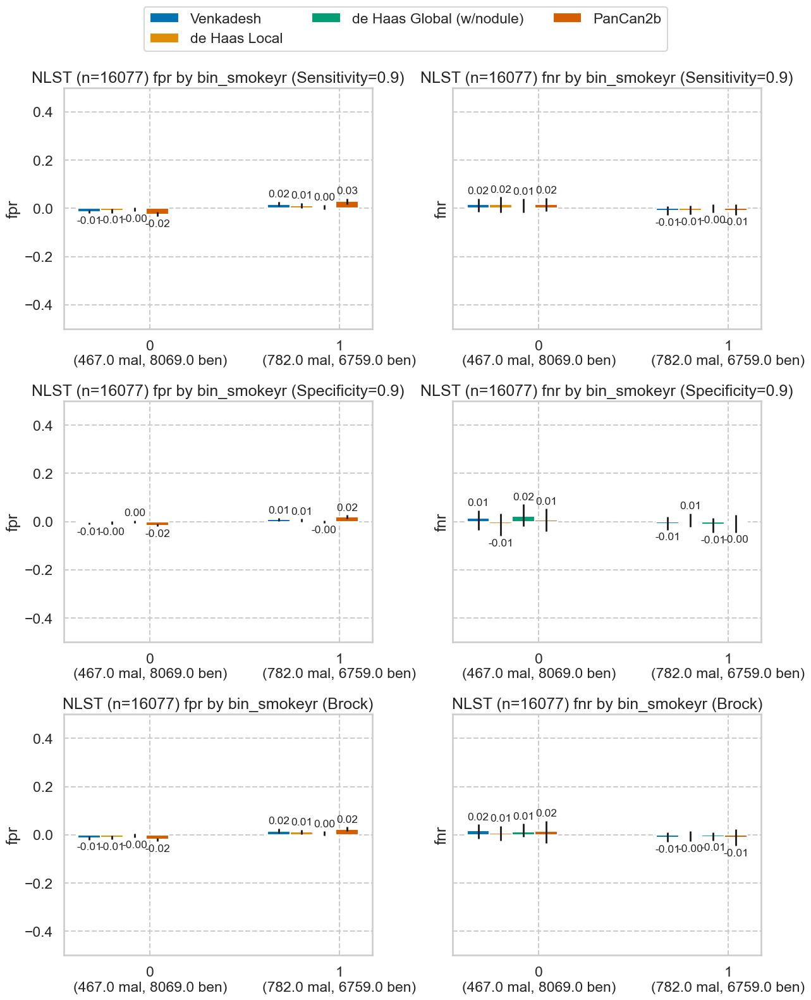

label                                                 pkyr  \
           count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                
0         8211.0  0.061503  0.240265  0.0  0.0  0.0  0.0  1.0  8211.0   
1         7866.0  0.094584  0.292658  0.0  0.0  0.0  0.0  1.0  7866.0   

                                                                
               mean        std    min   25%   50%   75%    max  
bin_pkyr                                                        
0         40.747022   5.740066  30.00  36.0  41.0  45.0   51.0  
1         76.242639  23.119408  51.25  60.0  70.0  86.0  260.0

### bin_pkyr

,num,pct,mal,ben,pct_mal
0,8211,51.072961,505,7706,6.150286
1,7866,48.927039,744,7122,9.458429


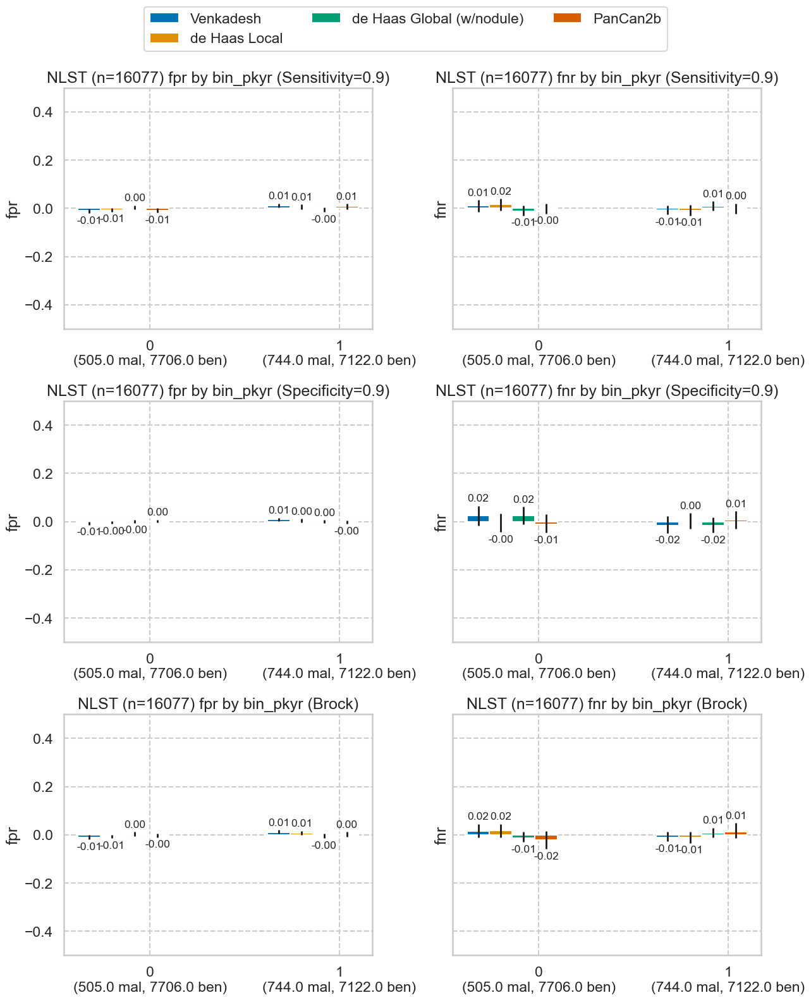

In [22]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, labels=False)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,7.484239,4.441719,4.0,4.8,6.0,8.4,69.2
1,1249.0,14.350520,9.007492,4.0,8.6,12.1,17.5,83.0


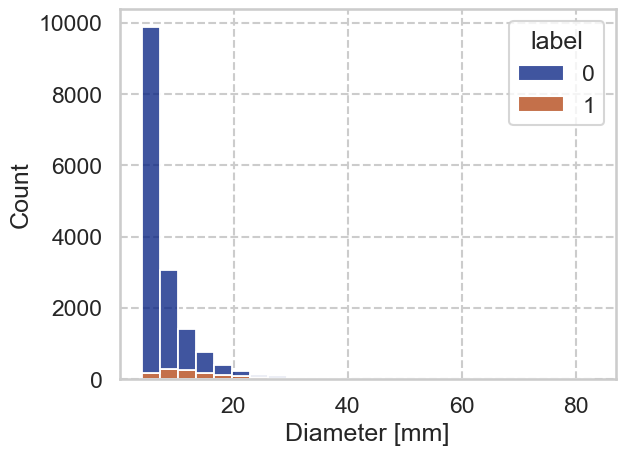

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,2.569463,1.665965,1.0,1.0,2.0,3.0,12.0
1,1249.0,2.383507,1.367931,1.0,1.0,2.0,3.0,11.0


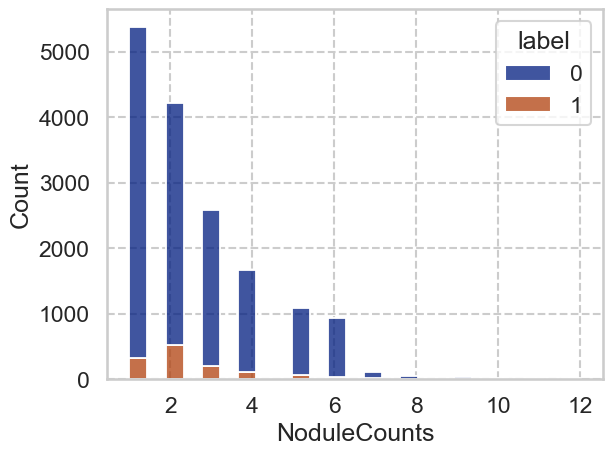

In [23]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_268\3226706664.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())


label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                         
(0, 1]             5375.0  0.059535  0.236645  0.0  0.0  0.0  0.0  1.0   
(1, 12]           10702.0  0.086806  0.281564  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0, 1]                 5375.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
(1, 12]               10702.0  3.336012  1.497645  2.0  2.0  3.0  4.0  12.0

### bin_NoduleCounts

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\data.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,mal,ben,pct_mal
"(0, 1]",5375,33.432854,320,5055,5.953488
"(1, 12]",10702,66.567146,929,9773,8.680620


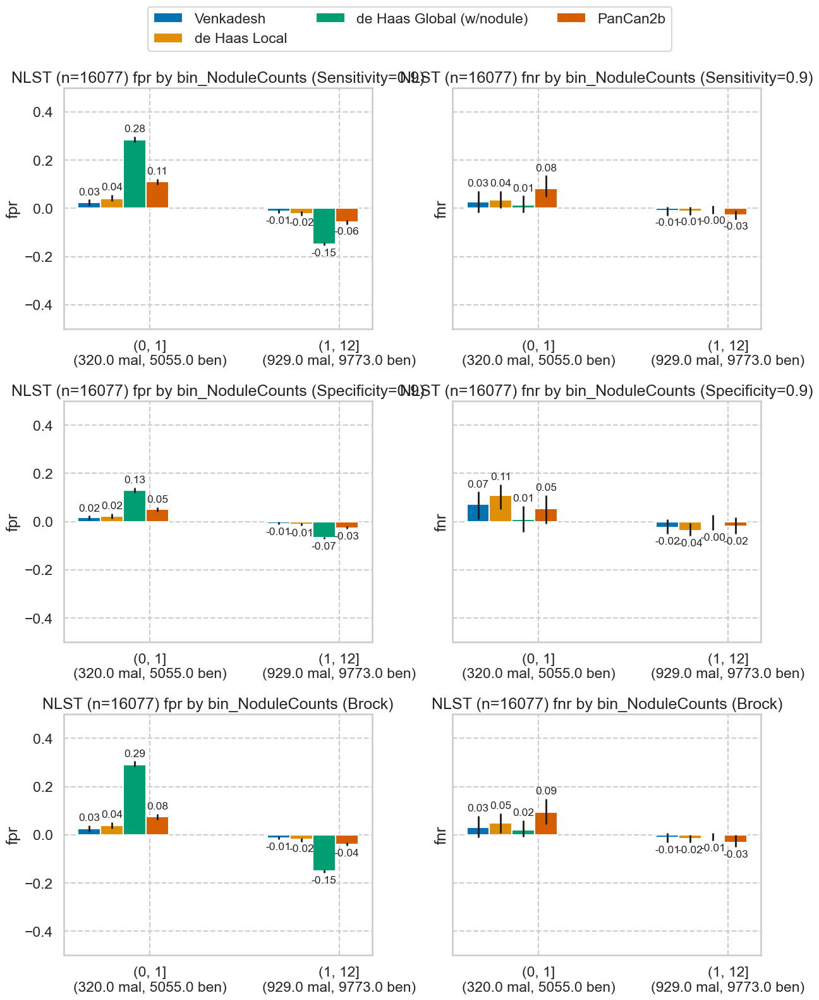

In [24]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
0                  8206.0  0.015476  0.123446  0.0  0.0  0.0  0.0  1.0   
1                  7871.0  0.142549  0.349634  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                            \
                          count       mean       std  min  25%  50%   75%   
bin_Diameter [mm]                                                           
0                        8206.0   4.992603  0.635664  4.0  4.5  4.9   5.5   
1                        7871.0  11.171490  6.084835  6.3  7.3  9.2  12.8   

                         
                    max  
bin_Diameter [mm]        
0                   6.2  
1                  83.0

### bin_Diameter [mm]

,num,pct,mal,ben,pct_mal
0,8206,51.041861,127,8079,1.547648
1,7871,48.958139,1122,6749,14.254860


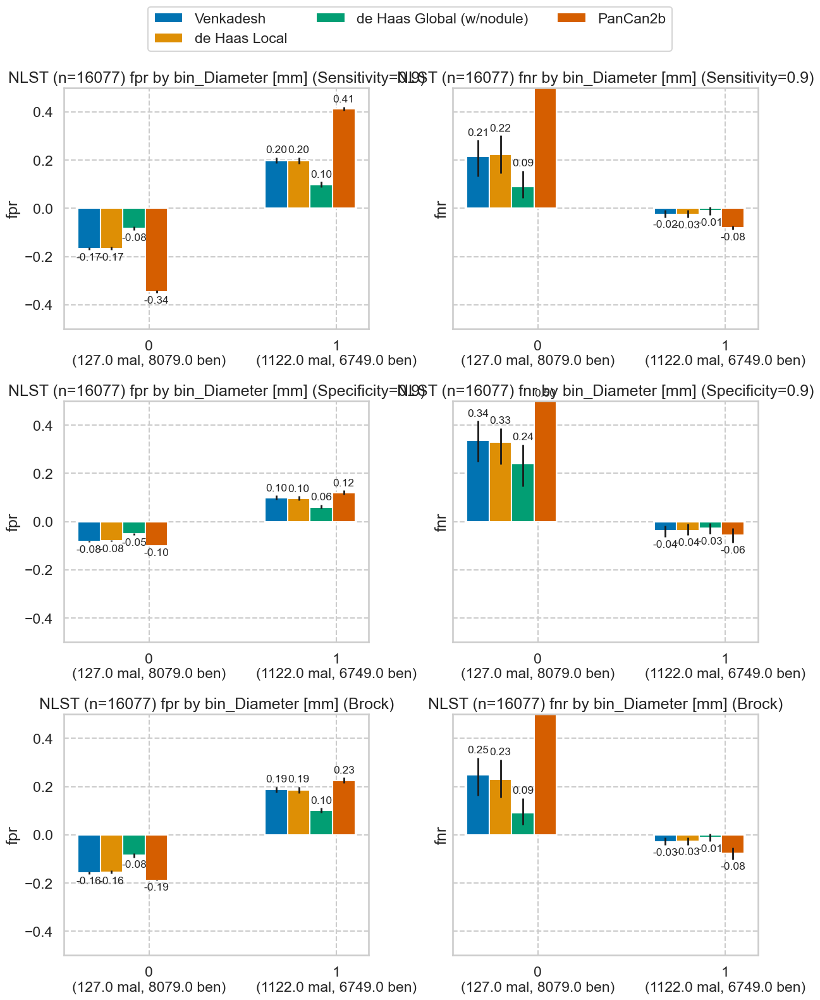

In [25]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2, labels=False)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')